In [19]:
import sys
import os
os.environ['USE_PYGEOS'] = '0'
import gc
import collections
from pathlib import Path

import cartopy.crs as ccrs
import cartopy
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams, cycler
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import geopandas as gpd
from statsmodels.tsa.seasonal import seasonal_decompose

import numpy as np
import xarray as xr
from xeofs.xarray import EOF
import rioxarray

import dask
import distributed

import scipy
from scipy import signal
import cftime
from shapely.geometry import mapping
from xarrayutils.utils import linear_trend, xr_linregress
import pandas as pd
import cmocean

import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

dask.config.set(malloc_hook='jemalloc')

# FIXIT: Jupyter Lab scheduler view for Dask not working
client = distributed.Client()
client

/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 55744 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:55744/status,
Dashboard: http://127.0.0.1:55744/status,Workers: 5
Total threads: 10,Total memory: 16.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:55745,Workers: 5
Dashboard: http://127.0.0.1:55744/status,Total threads: 10
Started: Just now,Total memory: 16.00 GiB
Comm: tcp://127.0.0.1:55759,Total threads: 2
Dashboard: http://127.0.0.1:55763/status,Memory: 3.20 GiB
Nanny: tcp://127.0.0.1:55748,


In [20]:
def dedraft(data, draft, weights=None):
    """
    Remove draft dependence from the data using (optionally weighted) linear regression.

    Args:
        data (xarray.DataArray): Input data (e.g., melt rate).
        draft (xarray.DataArray): Draft data.
        weights (xarray.DataArray or None): Optional weights for each grid cell (same shape as data).

    Returns:
        float: Regression coefficient (slope).
        float: Regression intercept.
        xarray.DataArray: Predicted draft dependence (same shape as data_tm).
    """
    # Compute time mean
    data_tm = data.mean(dim='Time')
    draft_tm = draft.mean(dim='Time')

    # Stack spatial dimensions
    data_stack = data_tm.stack(z=('x', 'y'))
    draft_stack = draft_tm.stack(z=('x', 'y'))

    # Mask valid (non-NaN) points
    valid_mask = (~data_stack.isnull()) & (~draft_stack.isnull())
    X = draft_stack.values[valid_mask].reshape(-1, 1)
    y = data_stack.values[valid_mask].reshape(-1, 1)

    # Prepare weights if provided
    if weights is not None:
        weights_tm = weights.mean(dim='Time') if 'Time' in weights.dims else weights
        weights_stack = weights_tm.stack(z=('x', 'y'))
        w = weights_stack.values[valid_mask].flatten()
    else:
        w = None

    # Fit linear regression (weighted if w is not None)
    reg = LinearRegression()
    reg.fit(X, y, sample_weight=w)

    # Predict for all valid points
    y_pred = np.full(data_stack.shape, np.nan)
    y_pred[valid_mask] = reg.predict(X).flatten()

    # Restore to original DataArray shape
    data_pred_stack = xr.full_like(data_stack, np.nan)
    data_pred_stack.values[:] = y_pred
    data_pred = data_pred_stack.unstack('z').transpose()

    return float(reg.coef_[0]), float(reg.intercept_), data_pred

In [21]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from shapely.ops import unary_union
from scipy.spatial import cKDTree
from sklearn.linear_model import LinearRegression
from scipy.signal import savgol_filter, medfilt
from pathlib import Path
from aislens.utils import write_crs
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go

In [22]:
main_dir = Path.cwd().parent
DIR_external = 'data/external/'
DIR_processed = 'data/processed/'
FILE_iceShelvesShape = 'iceShelves.geojson'
FILE_basalMeltObs_deSeasonalized = 'obs23_melt_anm.nc'

icems = gpd.read_file(main_dir / DIR_external / FILE_iceShelvesShape)
icems = icems.to_crs("EPSG:3031")

obs23_melt_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").melt.mean('Time').compute()
obs23_draft_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").draft.mean('Time').compute()
obs23_melt_tm = write_crs(obs23_melt_tm)
obs23_draft_tm = write_crs(obs23_draft_tm)

insar_gl_shape = gpd.read_file(main_dir / DIR_external / "NSIDC-0498_2-20250709_194639/InSAR_GL_Antarctica_v02.shp")
insar_gl_shape = insar_gl_shape.to_crs("EPSG:3031")


In [23]:
from aislens.config import config

In [27]:
obs23 = xr.open_dataset(config.FILE_PAOLO23_SATOBS, chunks = {'Time':26})
# Convert obs23.melt from m/year to kg/m^2/s, update these values in obs23 and its attributes
obs23_melt_SI = obs23.melt * 917 / (365.25 * 24 * 3600)  # Convert m/year to kg/m^2/s
obs23['melt'].values = obs23_melt_SI.values
obs23['melt'].attrs['units'] = 'kg m-2 s-1' 
obs23['melt'].attrs['long_name'] = 'Ice shelf basal melt rate from Paolo et al. (2023) (kg/m^2/s)'

2025-07-15 10:42:02,166 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 2.38 GiB -- Worker memory limit: 3.20 GiB
2025-07-15 10:42:02,265 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 2.49 GiB -- Worker memory limit: 3.20 GiB
2025-07-15 10:42:03,664 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- U

In [35]:
obs23.melt.attrs['units'] = 'kg m^-2 s^-1'
#obs23.attrs['long_name'] = 'Ice shelf basal melt rate'

In [37]:
config.FILE_PAOLO23_SATOBS

PosixPath('/Users/smurugan9/research/aislens/AISLENS/data/external/ANT_G1920V01_IceShelfMeltDraft_Time.nc')

In [38]:
obs23.to_netcdf("/Users/smurugan9/research/aislens/AISLENS/data/external/ANT_G1920V01_IceShelfMeltDraft_Time_SI.nc")

In [39]:
from aislens.dataprep import detrend_dim, deseasonalize

In [40]:
satobs23_melt_detrended = detrend_dim(obs23.melt, dim='Time', deg=1)

In [41]:
obs23_melt_ts = obs23.melt.mean({'x', 'y'})
satobs23_melt_detrended_ts = satobs23_melt_detrended.mean({'x', 'y'})

In [45]:
satobs23_melt_deseasonalized = deseasonalize(satobs23_melt_detrended)

In [56]:
# replace the values of ob23.melt with the deseasonalized values from satobs23_melt_deseasonalized
obs23.melt.values = satobs23_melt_deseasonalized.values

In [58]:
obs23.to_netcdf(config.FILE_PAOLO23_SATOBS_PREPARED)

In [46]:
satobs23_melt_deseasonalized_ts = satobs23_melt_deseasonalized.mean({'x', 'y'})

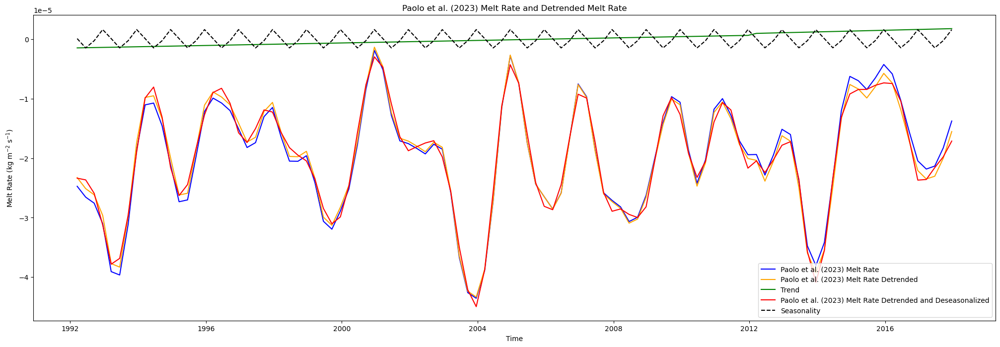

In [51]:
plt.figure(figsize=(25, 8))
plt.plot(obs23_melt_ts.Time, obs23_melt_ts, label='Paolo et al. (2023) Melt Rate', color='blue')
plt.plot(satobs23_melt_detrended_ts.Time, satobs23_melt_detrended_ts, label='Paolo et al. (2023) Melt Rate Detrended', color='orange')
plt.plot(obs23_melt_ts.Time, obs23_melt_ts - satobs23_melt_detrended_ts, label='Trend', color='green')
plt.plot(satobs23_melt_deseasonalized_ts.Time, satobs23_melt_deseasonalized_ts, label='Paolo et al. (2023) Melt Rate Detrended and Deseasonalized', color='red')
plt.plot(obs23_melt_ts.Time, satobs23_melt_detrended_ts - satobs23_melt_deseasonalized_ts, label='Seasonality', color='black', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Melt Rate (kg m$^{-2}$ s$^{-1}$)')
plt.title('Paolo et al. (2023) Melt Rate and Detrended Melt Rate')
plt.legend()
plt.show()

In [ ]:
# Dedraft using weights that are based on the fourth root of draft



In [ ]:
################################
# --- Helper Functions ---
################################

def find_ice_shelf_index(ice_shcelf_name):
    return icems[icems['name'] == ice_shelf_name].index[0]

def clip_data(total_data, basin):
    from shapely.geometry import mapping
    return total_data.rio.clip(icems.loc[[basin],'geometry'].apply(mapping), icems.crs)

def get_distance_to_gl(mlt, icems, insar_gl_shape):
    gl_union = unary_union(insar_gl_shape.to_crs(icems.crs).geometry)
    gl_points = []
    for geom in gl_union.geoms if hasattr(gl_union, 'geoms') else [gl_union]:
        if geom.geom_type == 'LineString':
            gl_points.extend(np.array(geom.coords))
        elif geom.geom_type == 'MultiLineString':
            for line in geom.geoms:
                gl_points.extend(np.array(line.coords))
    gl_points = np.array(gl_points)
    tree = cKDTree(gl_points)
    x_coords, y_coords = np.meshgrid(mlt['x'].values, mlt['y'].values, indexing='xy')
    points_flat = np.column_stack([x_coords.ravel(), y_coords.ravel()])
    distances, _ = tree.query(points_flat)
    return distances.reshape(mlt.shape)

def find_draft_threshold_knee(h, mlt, window=15, poly=2):
    hvals = h.values.flatten()
    mvals = mlt.values.flatten()
    mask = ~np.isnan(hvals) & ~np.isnan(mvals)
    hvals = hvals[mask]
    mvals = mvals[mask]
    if len(hvals) < 10:
        return 1000
    sort_idx = np.argsort(hvals)
    h_sorted = hvals[sort_idx]
    m_sorted = mvals[sort_idx]
    bins = np.linspace(h_sorted.min(), h_sorted.max(), 100)
    digitized = np.digitize(h_sorted, bins)
    bin_medians = np.array([np.median(m_sorted[digitized == i]) for i in range(1, len(bins))])
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    win = min(window, len(bin_medians)//2*2+1)
    if win < 3: win = 3
    smoothed = savgol_filter(bin_medians, window_length=win, polyorder=poly)
    d2 = np.gradient(np.gradient(smoothed))
    knee_idx = np.argmax(d2)
    threshold = bin_centers[knee_idx]
    return threshold

def find_draft_threshold_knee_smooth(h, mlt, window=15, poly=2, min_draft=None, max_draft=None, quantile_clip=(0.01, 0.99)):
    hvals = h.values.flatten()
    mvals = mlt.values.flatten()
    mask = ~np.isnan(hvals) & ~np.isnan(mvals)
    hvals = hvals[mask]
    mvals = mvals[mask]
    # Clip outliers using quantiles
    if len(hvals) < 10:
        return 1000
    qlo, qhi = np.quantile(hvals, quantile_clip)
    hmask = (hvals >= qlo) & (hvals <= qhi)
    hvals = hvals[hmask]
    mvals = mvals[hmask]
    sort_idx = np.argsort(hvals)
    h_sorted = hvals[sort_idx]
    m_sorted = mvals[sort_idx]
    bins = np.linspace(h_sorted.min(), h_sorted.max(), 100)
    digitized = np.digitize(h_sorted, bins)
    # Use median for robustness
    bin_medians = np.array([np.median(m_sorted[digitized == i]) if np.sum(digitized == i) > 3 else np.nan for i in range(1, len(bins))])
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    # Remove bins with too few points
    valid = ~np.isnan(bin_medians)
    bin_medians = bin_medians[valid]
    bin_centers = bin_centers[valid]
    if len(bin_medians) < 5:
        return 1000
    # Robust smoothing
    win = min(window, len(bin_medians)//2*2+1)
    if win < 3: win = 3
    smoothed = medfilt(bin_medians, kernel_size=win)
    if len(smoothed) >= win:
        smoothed = savgol_filter(smoothed, window_length=win, polyorder=min(poly, win-1))
    d2 = np.gradient(np.gradient(smoothed))
    knee_idx = np.argmax(d2)
    threshold = bin_centers[knee_idx]
    # Enforce physical bounds
    if min_draft is not None:
        threshold = max(threshold, min_draft)
    if max_draft is not None:
        threshold = min(threshold, max_draft)
    return threshold

In [59]:
################################################################
# Weighting Methods for draft dependence calculation
################################################################

def draft_threshold_weight(h, threshold=1000):
    w = np.where(h.values > threshold, 1.0, 0.0)
    w[np.isnan(h.values)] = np.nan
    return w

def draft_threshold_weight_dynamic(h, mlt):
    threshold = find_draft_threshold_knee(h, mlt)
    print(f"Dynamic threshold for shelf: {threshold}")
    w = np.where(h.values > threshold, 1.0, 0.0)
    w[np.isnan(h.values)] = np.nan
    return w

def draft_threshold_weight_dynamic_smooth(h, mlt):
    threshold = find_draft_threshold_knee_smooth(h, mlt)
    print(f"Dynamic threshold for shelf (smooth): {threshold}")
    w = np.where(h.values > threshold, 1.0, 0.0)
    w[np.isnan(h.values)] = np.nan
    return w

def inv_GLdistance_weight(mlt, distances_2d, a=1):
    epsilon = 1e-6
    w = (1.0/(distances_2d + epsilon))**a
    w[np.isnan(mlt.values)] = np.nan
    return w

def draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=1):
    epsilon = 1e-6
    w = (np.abs(h.values)**a) * (1.0/(distances_2d + epsilon))**b
    w[np.isnan(mlt.values)] = np.nan
    return w

def melt_x_inv_GLdistance_weight(mlt, distances_2d, a=1, b=1):
    epsilon = 1e-6
    w = (np.abs(mlt.values)**a) * (1.0/(distances_2d + epsilon))**b
    w[np.isnan(mlt.values)] = np.nan
    return w

def melt_x_draft_weight(mlt, h, a=1, b=1):
    w = (np.abs(mlt.values)**a) * (np.abs(h.values)**b)
    w[np.isnan(mlt.values)] = np.nan
    return w

def gaussian_draft_weight(h, mu=1200, sigma=300):
    w = np.exp(-0.5 * ((h.values-mu)/sigma)**2)
    w[np.isnan(h.values)] = np.nan
    return w

def gaussian_draft_weight_dynamic(h):
    # Compute mean and std only for non-NaN values
    valid = ~np.isnan(h.values)
    mu = np.nanmean(h.values)
    sigma = np.nanstd(h.values)
    w = np.exp(-0.5 * ((h.values - mu) / sigma) ** 2)
    w[~valid] = np.nan
    return w

def sigmoid_weight(h, mu=None, k=0.005, a=1):
    """
    Sigmoid weighting function with optional power law.
    Args:
        h: draft array
        mu: center of sigmoid (default: mean of h)
        k: steepness
        a: power to raise the sigmoid (default 1)
    Returns:
        Weight array, same shape as h
    """
    if mu is None:
        mu = np.nanmean(h.values)
    w = 1 / (1 + np.exp(-k * (h.values - mu)))
    w = w ** a
    w[np.isnan(h.values)] = np.nan
    return w

def sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=1, k=0.005, mu=None):
    """
    Combined weight: (sigmoid_draft^a) * (inv_GLdistance^b)
    - a: power for sigmoid_draft
    - b: power for inv_GLdistance
    - k: steepness for sigmoid
    - mu: center for sigmoid (default: mean draft)
    """
    if mu is None:
        mu = np.nanmean(h.values)
    # Sigmoid draft weight
    sigmoid = 1 / (1 + np.exp(-k * (h.values - mu)))
    # Inverse GL distance weight
    epsilon = 1e-6
    inv_dist = 1.0 / (distances_2d + epsilon)
    # Combine with powers
    w = (sigmoid ** a) * (inv_dist ** b)
    w[np.isnan(mlt.values)] = np.nan
    return w

def uniform_weight(mlt, h):
    w = np.ones_like(mlt.values)
    w[np.isnan(mlt.values)] = np.nan
    return w

def abs_melt_weight(mlt, h):
    w = np.abs(mlt.values)
    w[np.isnan(mlt.values)] = np.nan
    return w

def draft_weight(mlt, h, a=1):
    w = np.abs(h.values)**a
    w[np.isnan(mlt.values)] = np.nan
    return w

def combined_weight(mlt, h, distances_2d, a=1, b=1, c=1, d=1, e=1, f=1):
    # a: melt, b: draft, c: inv_distance, d: gaussian, e: static threshold, f: dynamic threshold
    w = (np.abs(mlt.values)**a) * (np.abs(h.values)**b)
    if distances_2d is not None:
        w *= (1.0/(distances_2d + 1e-6))**c
    w *= gaussian_draft_weight(h, mu=1200, sigma=300)**d
    w *= draft_threshold_weight(h, threshold=1000)**e
    w *= draft_threshold_weight_dynamic(h, mlt)**f
    w[np.isnan(mlt.values)] = np.nan
    return w

In [8]:
################################
# Main Comparison Function
################################

def collect_cumulative_melt_results(
    shelfname, obs23_melt_tm, obs23_draft_tm, icems, insar_gl_shape, 
    clip_data, find_ice_shelf_index, cell_area=3*3*1e6, rho_ice=917,
    combined_powers=(1,1,1,1,1,1)
):
    i = find_ice_shelf_index(shelfname)
    mlt = clip_data(obs23_melt_tm, i)
    h = clip_data(obs23_draft_tm, i)
    distances_2d = get_distance_to_gl(mlt, icems, insar_gl_shape)
    methods = {
        "uniform": lambda mlt, h: uniform_weight(mlt, h),
        "abs_melt": lambda mlt, h: abs_melt_weight(mlt, h),
        "draft": lambda mlt, h: draft_weight(mlt, h, a=1),
        "draft^0.5": lambda mlt, h: draft_weight(mlt, h, a=0.5),
        "draft^0.25": lambda mlt, h: draft_weight(mlt, h, a=0.25),
        "draft^0.125": lambda mlt, h: draft_weight(mlt, h, a=0.125),
        "draft^2": lambda mlt, h: draft_weight(mlt, h, a=2),
        "draft^1.5": lambda mlt, h: draft_weight(mlt, h, a=1.5),
        #"draft>1000m": lambda mlt, h: draft_threshold_weight(h, threshold=1000),
        #"draft>dynamic": lambda mlt, h: draft_threshold_weight_dynamic(h, mlt),
        #"draft>dynamic_smooth": lambda mlt, h: draft_threshold_weight_dynamic_smooth(h, mlt),
        #"gaussian_draft": lambda mlt, h: gaussian_draft_weight(h, mu=1200, sigma=300),
        "gaussian_draft_dynamic": lambda mlt, h: gaussian_draft_weight(h),
        "sigmoid_draft": lambda mlt, h: sigmoid_weight(h),
        "sigmoid_draft^0.5": lambda mlt, h: sigmoid_weight(h, a=0.5),
        "sigmoid_draft^0.25": lambda mlt, h: sigmoid_weight(h, a=0.25),
        "sigmoid_draft^0.125": lambda mlt, h: sigmoid_weight(h, a=0.125),
        "sigmoid_draft^2": lambda mlt, h: sigmoid_weight(h, a=2),
        "inv_GLdistance": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d),
        "inv_GLdistance^0.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=0.5),
        "inv_GLdistance^2": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=2),
        "inv_GLdistance^1.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=1.5),
        "sigmoid_x_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d),
        "sigmoid_x_inv_GLdistance^0.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=0.5),
        "sigmoid_x_inv_GLdistance^2": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=2),
        "sigmoid_x_inv_GLdistance^1.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=1.5),
        "sigmoid_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-1),
        "sigmoid^0.5_/_inv_GLdistance^0.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-0.5),
        "sigmoid^0.25_/_inv_GLdistance^0.25": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.25, b=-0.25),
        "sigmoid^0.125_/_inv_GLdistance^0.125": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.125, b=-0.125),
        "sigmoid^0.5_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-1),
        "sigmoid^1.5_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1.5, b=-1),
        "sigmoid^2_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=2, b=-1),
        "draft_x_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d),
        "draft_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-1),
        "draft^0.5_/_inv_GLdistance^0.5": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-0.5),
        "draft^0.25_/_inv_GLdistance^0.25": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.25, b=-0.25),
        "draft^0.5_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-1),
        "draft^1.5_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1.5, b=-1),
        "draft^2_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=2, b=-1),
        "draft_/_inv_GLdistance^2": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-2),
        "draft_/_inv_GLdistance^0.5": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-0.5),
        "melt_x_inv_GLdistance": lambda mlt, h: melt_x_inv_GLdistance_weight(mlt, distances_2d),
        "melt_x_draft": lambda mlt, h: melt_x_draft_weight(mlt, h),
        "melt_/_draft": lambda mlt, h: melt_x_draft_weight(mlt, h, a=1, b=-1),
        #"combined": lambda mlt, h: combined_weight(mlt, h, distances_2d, *combined_powers),
    }
    mlt_stack = mlt.stack(z=('x', 'y'))
    h_stack = h.stack(z=('x', 'y'))
    mlt_stack_noNaN = mlt_stack.fillna(0)
    h_stack_noNaN = h_stack.fillna(0)
    mlt_stack_noNaN_vals = mlt_stack_noNaN.values.reshape(-1,1)
    h_stack_noNaN_vals = h_stack_noNaN.values.reshape(-1,1)
    results = {}
    for wname, func in methods.items():
        try:
            w2d = func(mlt, h)
            weights_stack = mlt.copy(data=w2d).stack(z=('x', 'y')).fillna(0)
            w = np.squeeze(weights_stack.values.reshape(-1,1))
            # Skip if all weights are zero or NaN
            if np.all((w == 0) | np.isnan(w)):
                print(f"Skipping {shelfname} - {wname}: all weights zero or NaN")
                continue
            reg = LinearRegression().fit(h_stack_noNaN_vals, mlt_stack_noNaN_vals, sample_weight=w)
            y_pred = reg.predict(h_stack_noNaN_vals).reshape(-1)
            mlt_pred_stack_noNaN = mlt_stack_noNaN.copy(data=y_pred)
            mlt_pred_stack = mlt_pred_stack_noNaN.where(~mlt_stack.isnull(), np.nan)
            mlt_pred = mlt_pred_stack.unstack('z').transpose()
            mlt_is = mlt * cell_area * rho_ice
            mlt_is_cuml = float(mlt_is.sum().values) * 1e-12
            mlt_pred_is = mlt_pred * cell_area * rho_ice
            mlt_pred_is_cuml = float(mlt_pred_is.sum().values) * 1e-12
            results[wname] = (mlt_is_cuml, mlt_pred_is_cuml)
        except Exception as e:
            print(f"Skipping {shelfname} - {wname}: {e}")
            continue
    return results

def plot_cumulative_melt_comparison_across_shelves(results_dict):
    # Union of all methods present in any shelf
    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())
    # Observed: use the first available method for each shelf
    obs = [next(iter(results_dict[s].values()))[0] if results_dict[s] else np.nan for s in shelves]
    # Predicted: for each method, fill with np.nan if missing
    preds = {
        m: [results_dict[s][m][1] if m in results_dict[s] else np.nan for s in shelves]
        for m in all_methods
    }
    diffs = {
        m: [preds[m][i] - obs[i] if not np.isnan(preds[m][i]) and not np.isnan(obs[i]) else np.nan for i in range(len(shelves))]
        for m in all_methods
    }

    fig, axs = plt.subplots(2, 1, figsize=(16, 10), sharex=True)
    for m in all_methods:
        axs[0].bar(np.arange(len(shelves)) + 0.1*all_methods.index(m), preds[m], width=0.1, label=m)
    axs[0].plot(obs, 'ko-', label='Observed')
    axs[0].set_ylabel('Cumulative Draft-Dependent Melt (Gt/yr)')
    axs[0].set_title('Cumulative Melt by Weighting Method')
    axs[0].legend()
    for m in all_methods:
        axs[1].bar(np.arange(len(shelves)) + 0.1*all_methods.index(m), diffs[m], width=0.1, label=m)
    axs[1].axhline(0, color='k', lw=1)
    axs[1].set_ylabel('Difference from Observed (Gt/yr)')
    axs[1].set_title('Difference from Observed')
    axs[1].set_xticks(np.arange(len(shelves)))
    axs[1].set_xticklabels(shelves, rotation=90)
    axs[1].legend()
    plt.tight_layout()
    plt.show()

def make_summary_table(results_dict):
    # Union of all methods present in any shelf
    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())
    rows = []
    for shelf in shelves:
        # Use the first available method for observed value, or np.nan if none
        obs = next(iter(results_dict[shelf].values()))[0] if results_dict[shelf] else np.nan
        for m in all_methods:
            pred = results_dict[shelf][m][1] if m in results_dict[shelf] else np.nan
            diff = pred - obs if not np.isnan(pred) and not np.isnan(obs) else np.nan
            rel_err = np.nan if obs == 0 or np.isnan(diff) else diff / obs
            rows.append({
                "shelf": shelf,
                "method": m,
                "observed": obs,
                "predicted": pred,
                "diff": diff,
                "rel_error": rel_err
            })
    df = pd.DataFrame(rows)
    return df

Processing shelf: Abbot
Processing shelf: Amery
Processing shelf: Atka
Processing shelf: Aviator
Processing shelf: Bach
Processing shelf: Baudouin
Processing shelf: Borchgrevink
Processing shelf: Brahms
Processing shelf: Brunt_Stancomb
Processing shelf: Campbell
Processing shelf: Cheetham
Processing shelf: Conger_Glenzer
Processing shelf: Cook
Processing shelf: Cosgrove
Processing shelf: Crosson
Processing shelf: Dennistoun
Processing shelf: Dibble
Processing shelf: Dotson
Processing shelf: Drygalski
Processing shelf: Edward_VIII
Processing shelf: Ekstrom
Processing shelf: Ferrigno
Processing shelf: Filchner
Processing shelf: Fimbul
Processing shelf: Fitzgerald
Processing shelf: Frost
Processing shelf: GeikieInlet
Processing shelf: George_VI
Processing shelf: Getz
Processing shelf: Gillet
Processing shelf: Hamilton
Processing shelf: Hannan
Processing shelf: HarbordGlacier
Processing shelf: Helen
Processing shelf: Holmes
Processing shelf: HolmesWest
Processing shelf: Hull
Processing she

/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_94070/2441376280.py:73: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(h.values)
/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_94070/2441376280.py:88: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(h.values)


Processing shelf: Nickerson
Processing shelf: Ninnis
Processing shelf: Nivl
Processing shelf: Noll
Processing shelf: Nordenskjold
Processing shelf: Pine_Island
Processing shelf: PourquoiPas
Processing shelf: Prince_Harald
Processing shelf: Publications
Processing shelf: Quar
Processing shelf: Rayner_Thyer
Processing shelf: Rennick
Processing shelf: Richter
Processing shelf: Riiser-Larsen
Processing shelf: Ronne
Processing shelf: Western_Ross
Processing shelf: Eastern_Ross
Processing shelf: Shackleton
Processing shelf: Shirase
Processing shelf: Slava
Processing shelf: SmithInlet
Processing shelf: Stange
Processing shelf: Sulzberger
Processing shelf: Suvorov
Processing shelf: Swinburne
Processing shelf: Thwaites
Processing shelf: Tinker
Processing shelf: Totten
Processing shelf: Tracy_Tremenchus
Processing shelf: Tucker
Processing shelf: Underwood
Skipping Underwood - uniform: all weights zero or NaN
Skipping Underwood - abs_melt: all weights zero or NaN
Skipping Underwood - draft: all w

/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_94070/2441376280.py:73: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(h.values)
/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_94070/2441376280.py:88: RuntimeWarning: Mean of empty slice
  mu = np.nanmean(h.values)


Skipping Underwood - draft_/_inv_GLdistance^0.5: all weights zero or NaN
Skipping Underwood - melt_x_inv_GLdistance: all weights zero or NaN
Skipping Underwood - melt_x_draft: all weights zero or NaN
Skipping Underwood - melt_/_draft: all weights zero or NaN
Processing shelf: Utsikkar
Processing shelf: Venable
Processing shelf: Verdi
Processing shelf: Vigrid
Processing shelf: Vincennes
Processing shelf: Voyeykov
Processing shelf: West
Processing shelf: Wilkins
Processing shelf: Wilma_Robert_Downer
Processing shelf: Withrow
Processing shelf: Wordie
Processing shelf: Wylde
Processing shelf: Zubchatyy


/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_94070/1010152113.py:124: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


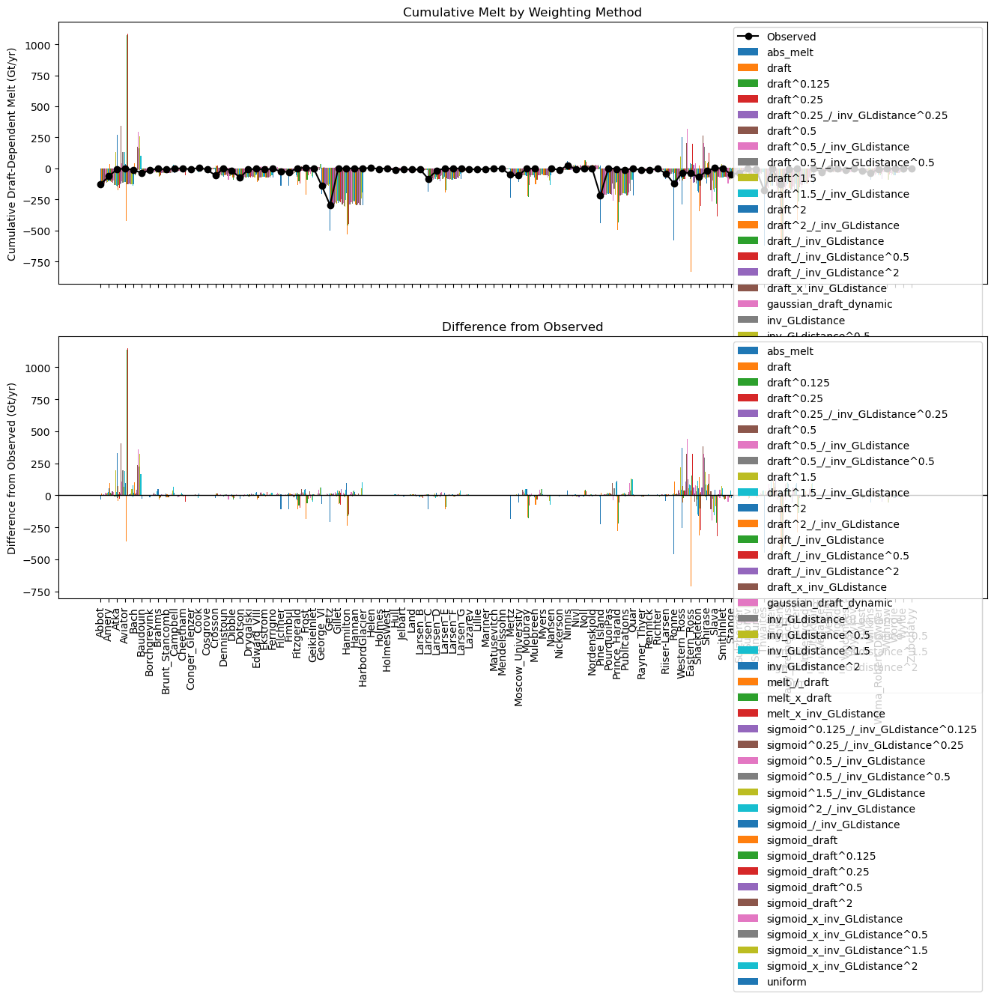

In [11]:
# --- Run for all shelves ---
shelf_names = list(icems.name.values)[33:]
results_dict = {}
for shelfname in shelf_names:
    print(f"Processing shelf: {shelfname}")
    try:
        results = collect_cumulative_melt_results(
            shelfname, obs23_melt_tm, obs23_draft_tm, icems, insar_gl_shape, 
            clip_data, find_ice_shelf_index,
            combined_powers=(1,1,1,1,1,1)  # You can tune these powers!
        )
        results_dict[shelfname] = results
    except Exception as e:
        print(f"Skipping {shelfname}: {e}")

plot_cumulative_melt_comparison_across_shelves(results_dict)

# --- Summary Table and Export ---
summary_df = make_summary_table(results_dict)
#display(summary_df)
#summary_df.to_csv("draft_dependence_method_comparison_summary.csv", index=False)

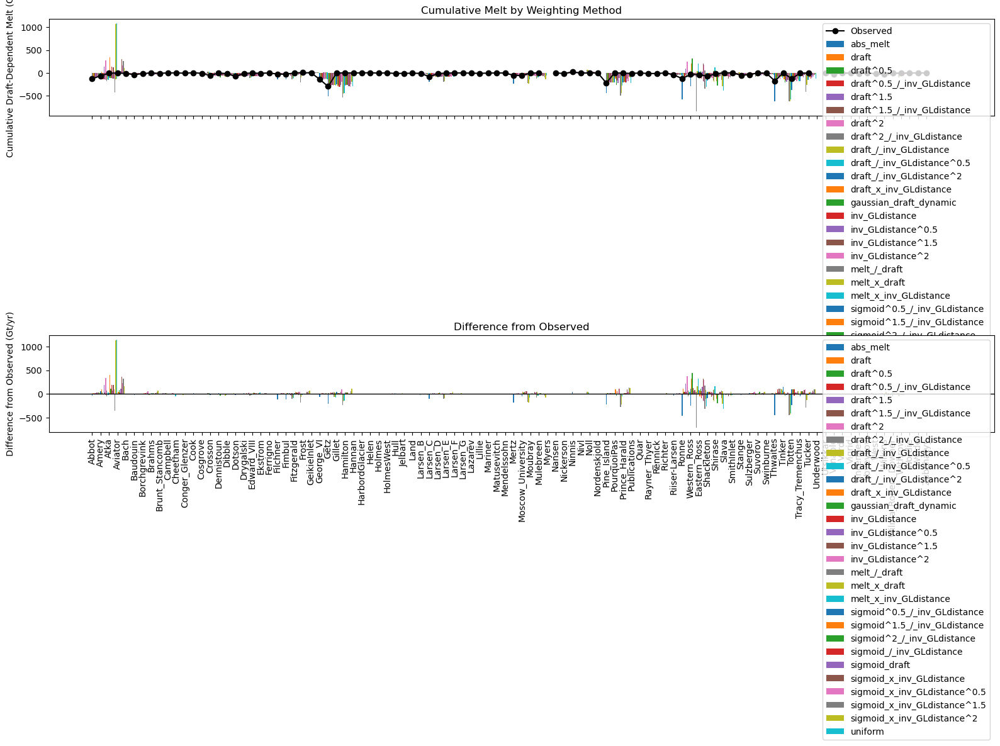

In [381]:
plot_cumulative_melt_comparison_across_shelves(results_dict)

In [ ]:
summary_df = make_summary_table(results_dict)
# display all the rows in summary_df
#pd.set_option('display.max_rows', None)
display(summary_df)

In [14]:
summary_df.to_csv("/Users/smurugan9/research/aislens/AISLENS/data/interim/draft_dependence/draft_dependence_method_comparison_summary.csv", index=False)

Filter the `results_dict` object to plot different subsets

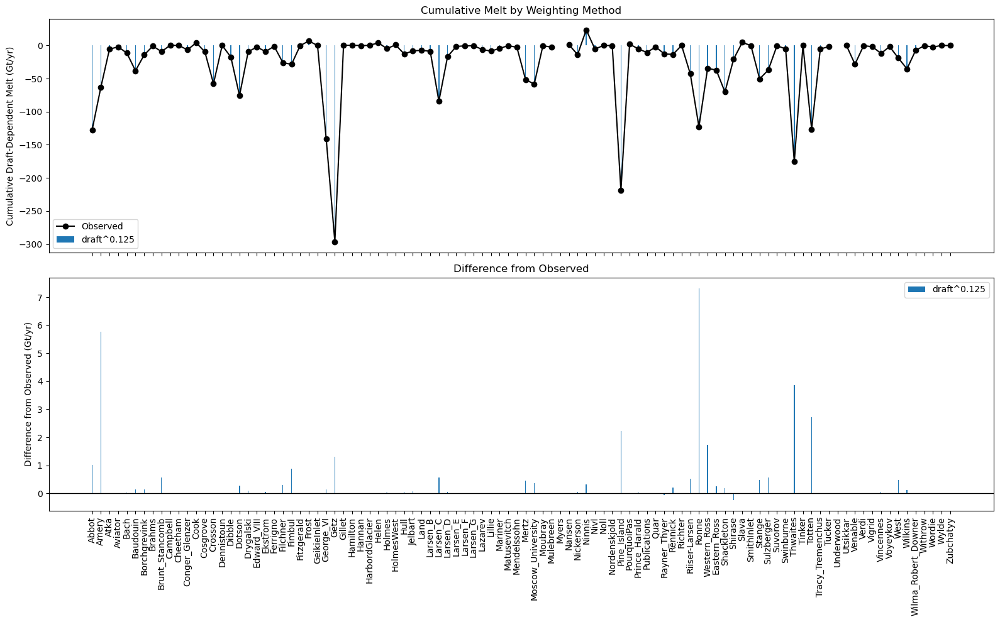

In [16]:
# results_dict - ignore the first two entries and copy the rest
#results_dict_copy = {k: v for k, v in results_dict.items() if k not in ['Ronne', 'Filchner']}
# results_dict - ignore draft>dynamic method and copy the rest
results_dict_filt = {k: {m: v for m, v in v.items() if m == 'draft_/_inv_GLdistance'} for k, v in results_dict.items()}
results_dict_filt = {k: {m: v for m, v in v.items() if m == 'draft^0.125'} for k, v in results_dict.items()}
plot_cumulative_melt_comparison_across_shelves(results_dict_filt)

## Observed vs. predicted melt rates across ice shelves

In [17]:
# Plot a scatter plot of observed vs predicted cumulative melt for each ice shelf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
def plot_categorical_scatter(results_dict):
    # Union of all methods present in any shelf
    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())

    data = []
    for shelf in shelves:
        # Use the first available method for observed value, or np.nan if none
        obs = next(iter(results_dict[shelf].values()))[0] if results_dict[shelf] else np.nan
        for m in all_methods:
            pred = results_dict[shelf][m][1] if m in results_dict[shelf] else np.nan
            data.append({
                "shelf": shelf,
                "method": m,
                "observed": obs,
                "predicted": pred
            })

    df = pd.DataFrame(data)

    plt.figure(figsize=(15, 15))
    sns.scatterplot(data=df, x='observed', y='predicted', hue='shelf', style='method', s=100)
    minval = np.nanmin(df['observed'])
    maxval = np.nanmax(df['observed'])
    plt.plot([minval, maxval], [minval, maxval], 'k--')
    plt.axhline(0, color='k', lw=1)
    plt.axvline(0, color='k', lw=1)
    plt.xlabel('Observed Cumulative Melt (Gt/yr)')
    plt.ylabel('Predicted Cumulative Melt (Gt/yr)')
    #plt.ylim(-300, 50)
    plt.title('Observed vs Predicted Cumulative Melt by Ice Shelf and Method')
    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
    plt.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=7)
    plt.tight_layout()
    plt.show()

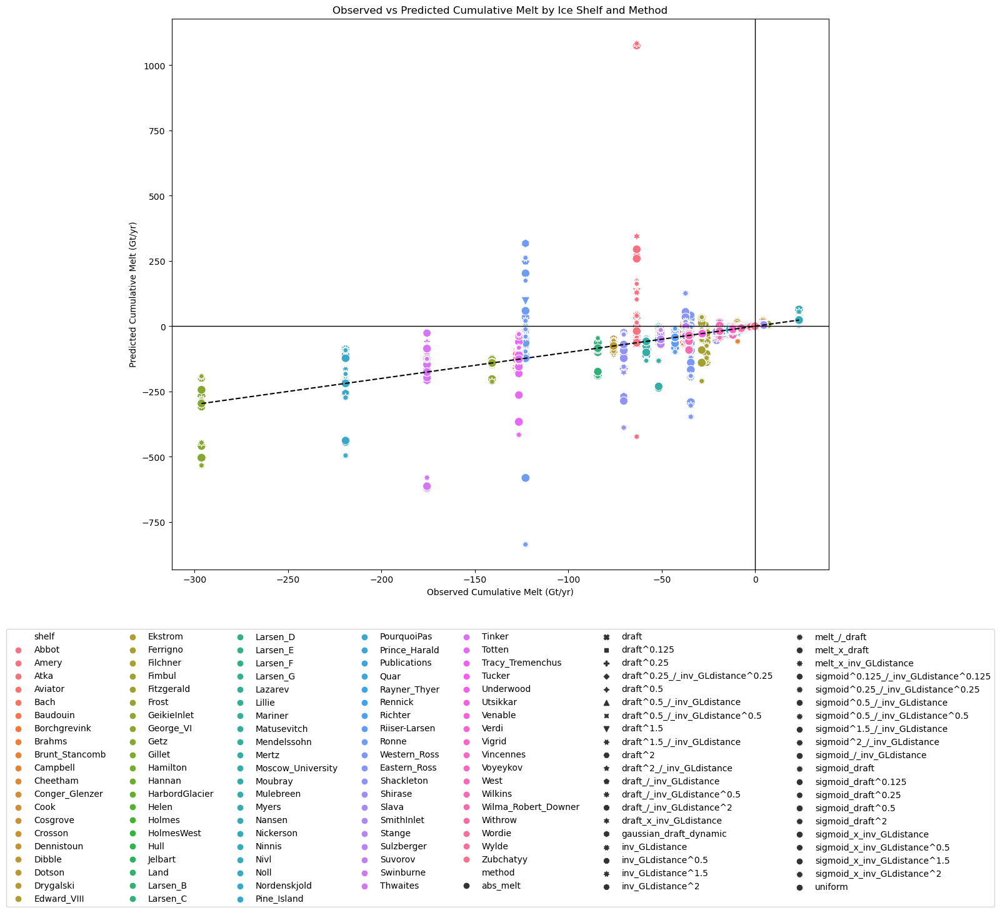

In [18]:
plot_categorical_scatter(results_dict)

Filter the `results_dict` object to plot specified methods only

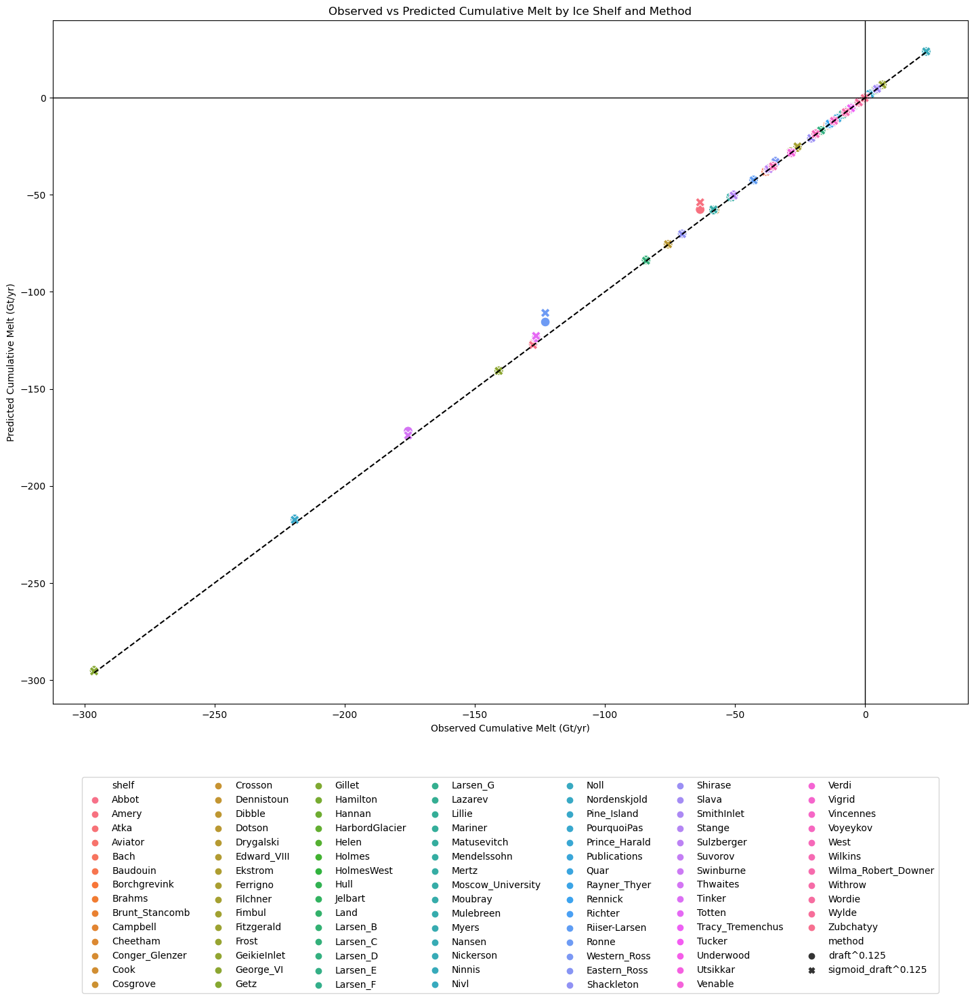

In [20]:
# Filter results_dict to only include desired methods
# "draft_/_inv_GLdistance", "draft",
desired_methods = [ "draft^0.125", "sigmoid_draft^0.125"]#"sigmoid_draft", "draft", "draft_/_inv_GLdistance"]
#desired_shelves = ["Ronne"] 
filtered_results_dict = {
    shelf: {k: v for k, v in methods.items() if k in desired_methods}
    for shelf, methods in results_dict.items()
    #if shelf not in desired_shelves
}
plot_categorical_scatter(filtered_results_dict) 

In [412]:
second = obs23_draft_tm**0.5
fourth = obs23_draft_tm**0.25

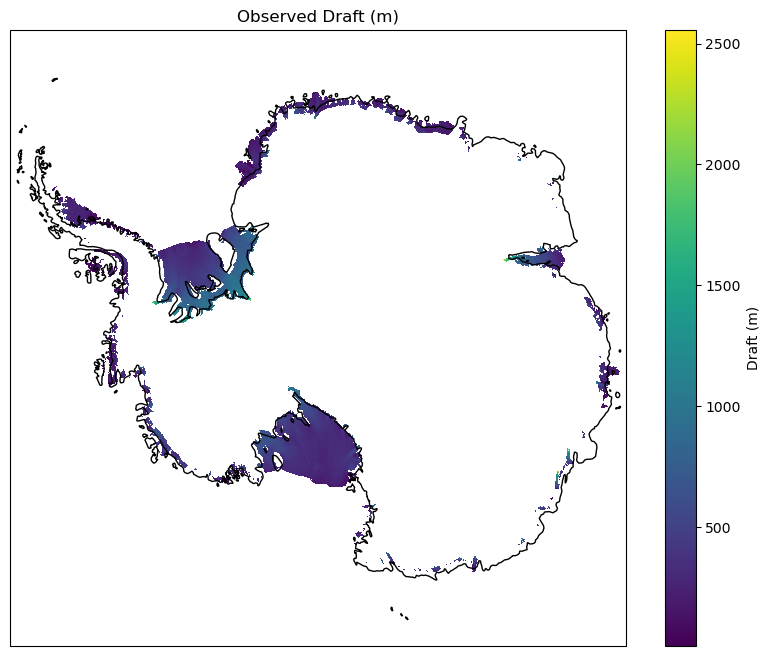

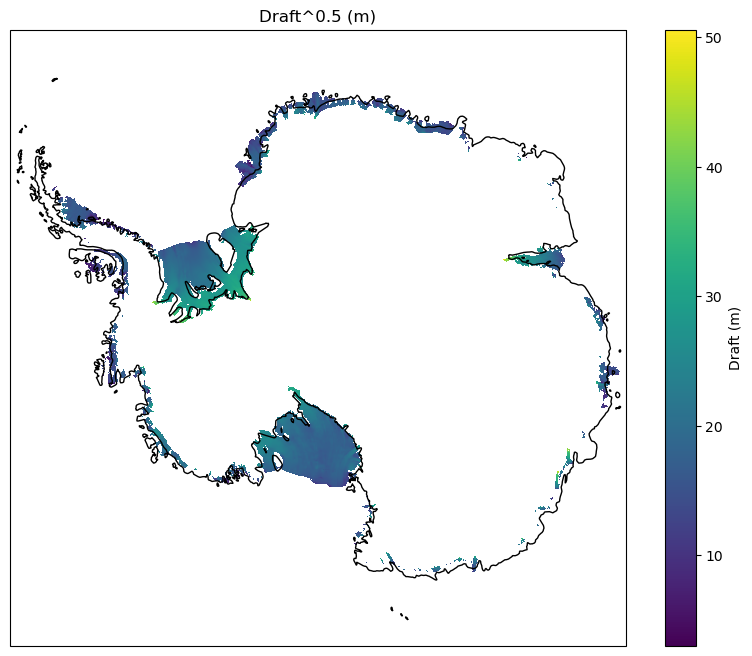

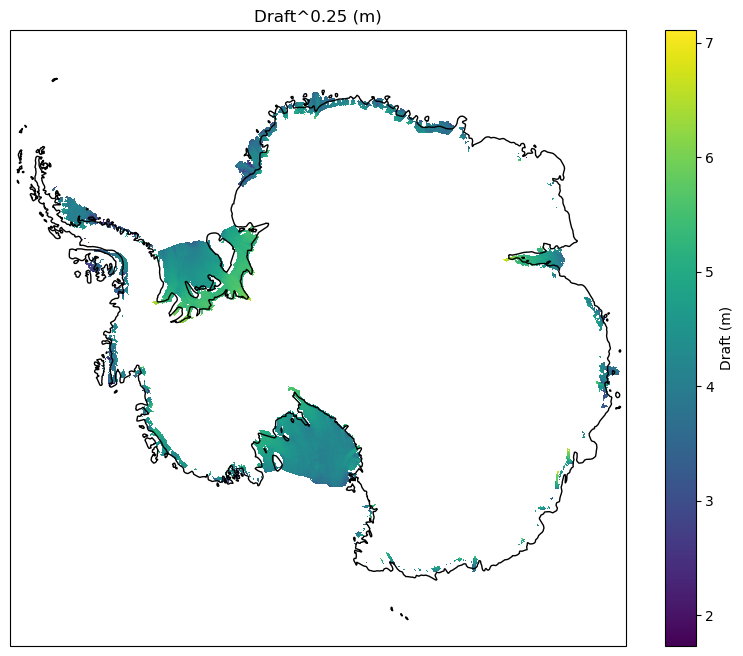

In [415]:
# plot maps of obs23_draft_tm, second, fourth 
def plot_maps(data, title):
    fig, ax = plt.subplots(1, 1, figsize=(10, 8), subplot_kw={'projection': ccrs.SouthPolarStereo()})
    data.rio.write_crs("EPSG:3031", inplace=True)
    data.plot(ax=ax, cmap='viridis', add_colorbar=True, cbar_kwargs={'label': 'Draft (m)'})
    ax.set_title(title)
    ax.coastlines()
    #ax.add_geometries(icems.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none')
    plt.show()

plot_maps(obs23_draft_tm, "Observed Draft (m)")
plot_maps(second, "Draft^0.5 (m)")
plot_maps(fourth, "Draft^0.25 (m)")

In [21]:
def plot_categorical_scatter(results_dict):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())

    data = []
    for shelf in shelves:
        obs = next(iter(results_dict[shelf].values()))[0] if results_dict[shelf] else np.nan
        for m in all_methods:
            pred = results_dict[shelf][m][1] if m in results_dict[shelf] else np.nan
            data.append({
                "shelf": shelf,
                "method": m,
                "observed": obs,
                "predicted": pred
            })

    df = pd.DataFrame(data)

    plt.figure(figsize=(15, 15))
    sns.scatterplot(data=df, x='observed', y='predicted', hue='shelf', style='method', s=100)
    minval = np.nanmin(df['observed'])
    maxval = np.nanmax(df['observed'])
    plt.plot([minval, maxval], [minval, maxval], 'k--')
    plt.axhline(0, color='k', lw=1)
    plt.axvline(0, color='k', lw=1)
    plt.xlabel('Observed Cumulative Melt (Gt/yr)')
    plt.ylabel('Predicted Cumulative Melt (Gt/yr)')
    plt.title('Observed vs Predicted Cumulative Melt by Ice Shelf and Method')
    plt.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=7)
    plt.tight_layout()

    # Add quadrant text
    xmid = minval + 0.5 * (maxval - minval)
    ymid = xmid
    xpad = 0.05 * (maxval - minval)
    ypad = 0.05 * (maxval - minval)
    # Overestimate (above 1:1 line, right side)
    plt.text(xmid, minval + ypad, "Overestimate\n(Model > Obs)", 
             ha='center', va='top', fontsize=14, color='blue', alpha=0.7)
    # Underestimate (below 0 horizontal line, center)
    plt.text(xmid, 0 - ypad, "Underestimate\n(Model < Obs)", 
             ha='center', va='top', fontsize=14, color='red', alpha=0.7)
    # Severe underestimate (above 0 horizontal, left of 0 vertical)
    plt.text(minval + xpad, maxval + ypad/2, "Severe underestimate.\nModel predicts accumulation instead of melt.", 
             ha='left', va='top', fontsize=13, color='red', alpha=0.8)

    plt.show()

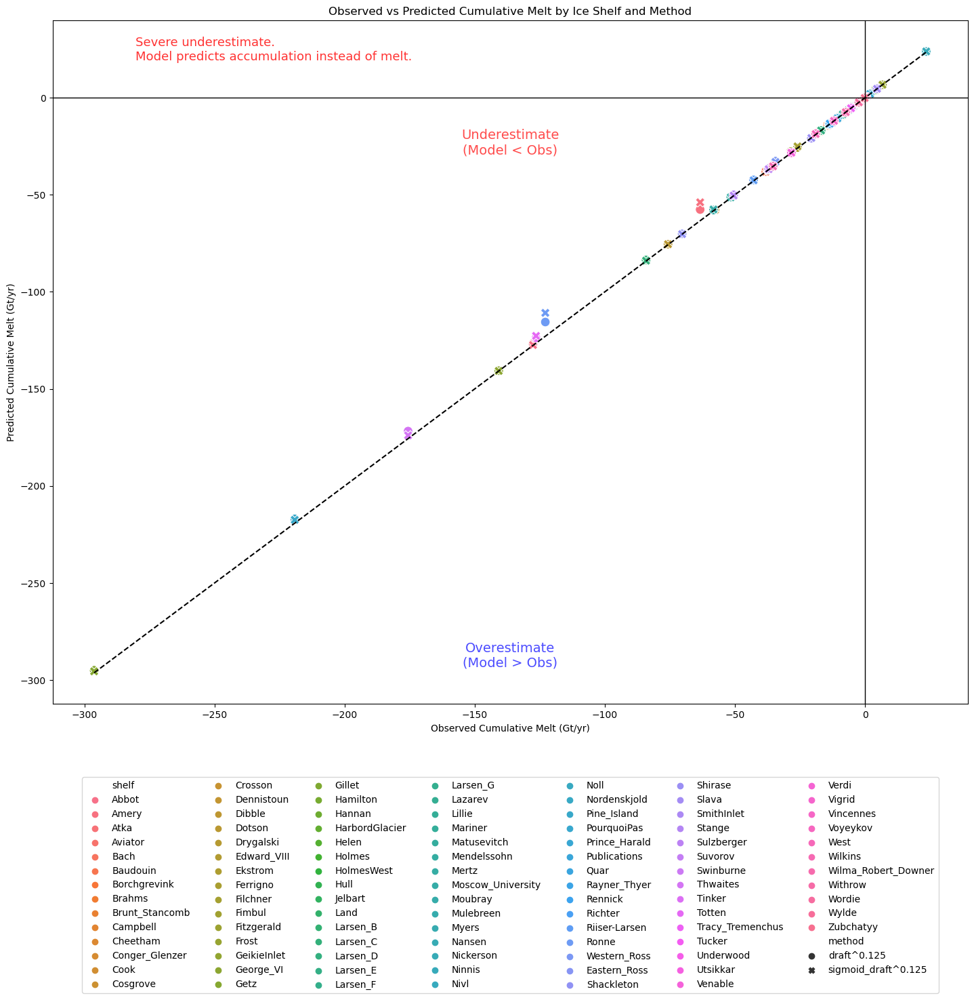

In [22]:
plot_categorical_scatter(filtered_results_dict)

## Interactive scatter plot of cumulative melt comparisons across ice shelves

In [340]:
import plotly.express as px
def plot_categorical_scatter_interactive(results_dict):
    # Union of all methods present in any shelf
    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())

    data = []
    for shelf in shelves:
        obs = next(iter(results_dict[shelf].values()))[0] if results_dict[shelf] else np.nan
        for m in all_methods:
            pred = results_dict[shelf][m][1] if m in results_dict[shelf] else np.nan
            data.append({
                "shelf": shelf,
                "method": m,
                "observed": obs,
                "predicted": pred
            })

    df = pd.DataFrame(data)

    fig = px.scatter(
        df,
        x="observed",
        y="predicted",
        color="shelf",
        symbol="method",
        hover_data=["shelf", "method", "observed", "predicted"],
        title="Observed vs Predicted Cumulative Melt by Ice Shelf and Method",
        width=500,
        height=500,
    )
    fig.add_shape(
        type="line",
        x0=df["observed"].min(), y0=df["observed"].min(),
        x1=df["observed"].max(), y1=df["observed"].max(),
        line=dict(color="black", dash="dash")
    )
    fig.update_layout(
        xaxis_title="Observed Cumulative Melt (Gt/yr)",
        yaxis_title="Predicted Cumulative Melt (Gt/yr)",
        legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5)
    )
    fig.show()

# Usage:
plot_categorical_scatter_interactive(filtered_results_dict)

## Validation metrics

Filter the `summary_df` table as required to analyze and validate subsets

In [23]:
# Display all the rows that have gaussian_draft as the method
#summary_df
# display(summary_df[summary_df['method'] != 'uniform'])
summary_df_filt = summary_df[summary_df['method'] != 'uniform']
#summary_df_filt


### Mean Absolute Error (MAE)

In [24]:
from pprint import pprint
methods = summary_df['method'].unique()
mae_by_method = {}
for m in methods:
    df = summary_df[summary_df['method'] == m]
    mae = np.mean(np.abs(df['predicted'] - df['observed']))
    mae_by_method[m] = mae
#print(mae_by_method)
pprint(mae_by_method)

{'abs_melt': 33.041059829098515,
 'draft': 4.269544871014594,
 'draft^0.125': 0.3465937883015998,
 'draft^0.25': 0.7512495411623339,
 'draft^0.25_/_inv_GLdistance^0.25': 1.2022516518275947,
 'draft^0.5': 1.7172813879091864,
 'draft^0.5_/_inv_GLdistance': 4.208684572628306,
 'draft^0.5_/_inv_GLdistance^0.5': 2.2515010875294768,
 'draft^1.5': 7.632616032698819,
 'draft^1.5_/_inv_GLdistance': 4.6677919496151645,
 'draft^2': 11.88311525041422,
 'draft^2_/_inv_GLdistance': 5.896219523013426,
 'draft_/_inv_GLdistance': 4.186787517514723,
 'draft_/_inv_GLdistance^0.5': 3.0861303988005817,
 'draft_/_inv_GLdistance^2': 8.001407938250212,
 'draft_x_inv_GLdistance': 15.605574587581716,
 'gaussian_draft_dynamic': 14.243831087209038,
 'inv_GLdistance': 8.81670334526435,
 'inv_GLdistance^0.5': 3.5497056112381893,
 'inv_GLdistance^1.5': 11.791750566706114,
 'inv_GLdistance^2': 12.948688062878748,
 'melt_/_draft': 42.0948017738256,
 'melt_x_draft': 37.02212727092267,
 'melt_x_inv_GLdistance': 36.96505

### Best count of shelves 

In [25]:

best_count = summary_df_filt.copy()
best_count['abs_err'] = np.abs(best_count['predicted'] - best_count['observed'])

# Drop rows where abs_err is NaN (i.e., missing predictions)
best_count = best_count.dropna(subset=['abs_err'])

# Only group shelves that have at least one valid method
if not best_count.empty:
    idx = best_count.groupby('shelf')['abs_err'].idxmin()
    # Drop any NaN indices (can happen if group is empty)
    idx = idx.dropna()
    best_methods = best_count.loc[idx]
    best_method_counts = best_methods['method'].value_counts()
    print(best_method_counts)
else:
    print("No valid shelves with non-NaN abs_err.")

sigmoid_draft^0.125                     62
draft^0.125                             15
sigmoid^0.125_/_inv_GLdistance^0.125     4
sigmoid^0.5_/_inv_GLdistance             3
draft^0.5_/_inv_GLdistance^0.5           2
draft^2                                  2
sigmoid^0.25_/_inv_GLdistance^0.25       2
sigmoid^1.5_/_inv_GLdistance             1
sigmoid^0.5_/_inv_GLdistance^0.5         1
sigmoid_draft^0.5                        1
sigmoid_/_inv_GLdistance                 1
draft^2_/_inv_GLdistance                 1
sigmoid_x_inv_GLdistance^0.5             1
draft_/_inv_GLdistance^0.5               1
draft_/_inv_GLdistance^2                 1
Name: method, dtype: int64


In [ ]:
def validation_metrics(summary_df):
    # Only use shelves with nonzero observed and predicted
    df = summary_df[(summary_df['observed'] != 0) & (summary_df['predicted'] != 0)].copy()
    df['sign_match'] = np.sign(df['predicted']) == np.sign(df['observed'])
    df['log10_err'] = np.abs(np.log10(np.abs(df['predicted'])) - np.log10(np.abs(df['observed'])))
    df['order_mag'] = df['log10_err'] < 1
    df['both'] = df['sign_match'] & df['order_mag']
    metrics = []
    for method in df['method'].unique():
        d = df[df['method'] == method]
        n = len(d)
        metrics.append({
            'method': method,
            'n_shelves': n,
            'sign_match_frac': d['sign_match'].mean(),
            'order_mag_frac': d['order_mag'].mean(),
            'both_frac': d['both'].mean(),
            'mean_log10_err': d.loc[d['both'], 'log10_err'].mean()
        })
    return pd.DataFrame(metrics)

# Usage:
metrics_df = validation_metrics(summary_df)
display(metrics_df)

,method,n_shelves,sign_match_frac,order_mag_frac,both_frac,mean_log10_err
0,abs_melt,100,0.96,0.98,0.96,2.370618e-01
1,draft,100,0.97,0.97,0.96,4.332273e-02
2,draft^0.125,100,0.98,0.98,0.98,3.364772e-03
3,draft^0.25,100,0.98,0.98,0.98,7.566024e-03
4,draft^0.25_/_inv_GLdistance^0.25,100,0.98,0.98,0.98,2.896466e-02
5,draft^0.5,100,0.98,0.98,0.98,1.917659e-02
6,draft^0.5_/_inv_GLdistance,100,0.97,0.97,0.96,8.334303e-02
7,draft^0.5_/_inv_GLdistance^0.5,100,0.98,0.98,0.98,5.418799e-02
8,draft^1.5,100,0.95,0.98,0.95,6.846869e-02
9,draft^1.5_/_inv_GLdistance,100,0.97,0.96,0.96,8.924935e-02


In [27]:
def validation_metrics(summary_df, frac_threshold=0.1):
    """
    Compute a suite of validation metrics for each method.
    """
    df = summary_df[(summary_df['observed'] != 0) & (summary_df['predicted'] != 0)].copy()
    df['sign_match'] = np.sign(df['predicted']) == np.sign(df['observed'])
    df['abs_err'] = np.abs(df['predicted'] - df['observed'])
    df['rel_err'] = df['abs_err'] / np.abs(df['observed'])
    df['log10_err'] = np.abs(np.log10(np.abs(df['predicted'])) - np.log10(np.abs(df['observed'])))
    df['order_mag'] = df['log10_err'] < 1
    df['both'] = df['sign_match'] & df['order_mag']
    df['within_frac'] = df['rel_err'] < frac_threshold

    metrics = []
    for method in df['method'].unique():
        d = df[df['method'] == method]
        n = len(d)
        # Robust correlation: only if at least 2 points and not constant
        if n > 1 and np.std(d['predicted']) > 0 and np.std(d['observed']) > 0:
            corr = np.corrcoef(d['predicted'], d['observed'])[0,1]
        else:
            corr = np.nan
        metrics.append({
            'method': method,
            'n_shelves': n,
            'MAE': d['abs_err'].mean(),
            'Median_AE': d['abs_err'].median(),
            'RMSE': np.sqrt(np.mean((d['predicted'] - d['observed'])**2)),
            'MAPE (%)': d['rel_err'].mean() * 100,
            'Frac_within_10%': d['within_frac'].mean(),
            'Sign_match_frac': d['sign_match'].mean(),
            'Order_mag_frac': d['order_mag'].mean(),
            'Both_frac': d['both'].mean(),
            'Mean_log10_err (both)': d.loc[d['both'], 'log10_err'].mean(),
            'Correlation': corr
        })
    return pd.DataFrame(metrics).sort_values('MAE')

# Usage:
metrics_df = validation_metrics(summary_df)
display(metrics_df)

,method,n_shelves,MAE,Median_AE,RMSE,MAPE (%),Frac_within_10%,Sign_match_frac,Order_mag_frac,Both_frac,Mean_log10_err (both),Correlation
40,uniform,100,0.000003,5.591955e-07,0.000007,0.000024,0.98,0.98,0.98,0.98,1.062479e-07,NaN
2,draft^0.125,100,0.346594,1.086837e-02,1.121892,0.761186,0.98,0.98,0.98,0.98,3.364772e-03,NaN
32,sigmoid_draft^0.125,100,0.377062,4.653962e-03,1.628363,0.672617,0.97,0.98,0.98,0.98,3.013633e-03,NaN
24,sigmoid^0.125_/_inv_GLdistance^0.125,100,0.628543,8.418833e-02,1.809351,3.529104,0.92,0.98,0.98,0.98,1.517981e-02,NaN
3,draft^0.25,100,0.751250,2.423561e-02,2.469840,1.671018,0.93,0.98,0.98,0.98,7.566024e-03,NaN
33,sigmoid_draft^0.25,100,0.802926,1.044544e-02,3.472903,1.442818,0.96,0.98,0.98,0.98,6.733802e-03,NaN
4,draft^0.25_/_inv_GLdistance^0.25,100,1.202252,2.049902e-01,3.642002,6.703521,0.83,0.98,0.98,0.98,2.896466e-02,NaN
25,sigmoid^0.25_/_inv_GLdistance^0.25,100,1.225534,1.497048e-01,3.573345,6.783555,0.80,0.98,0.98,0.98,2.919118e-02,NaN
5,draft^0.5,100,1.717281,5.454491e-02,5.860252,3.910306,0.90,0.98,0.98,0.98,1.917659e-02,NaN
34,sigmoid_draft^0.5,100,1.781406,2.450804e-02,7.762446,3.251046,0.91,0.98,0.98,0.98,1.750565e-02,NaN


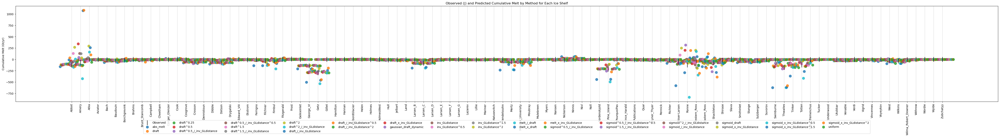

In [408]:
def plot_methods_overlay_per_shelf(results_dict):
    """
    For each ice shelf, plot observed cumulative melt (vertical line) and overlay all methods' predictions (scatter).
    """
    # Union of all methods present in any shelf
    all_methods = sorted(set(m for r in results_dict.values() for m in r.keys()))
    shelves = list(results_dict.keys())
    n_shelves = len(shelves)
    x = np.arange(n_shelves)
    # Use the first available method for observed value, or np.nan if none
    obs = [next(iter(results_dict[s].values()))[0] if results_dict[s] else np.nan for s in shelves]

    plt.figure(figsize=(max(14, n_shelves//2), 7))
    # Plot observed as vertical lines
    for i, val in enumerate(obs):
        plt.axvline(i, color='k', alpha=0.1, zorder=0)
        plt.scatter(i, val, color='k', marker='|', s=300, label='Observed' if i == 0 else "", zorder=3)
    # Overlay all methods
    colors = plt.cm.tab10.colors
    for mi, m in enumerate(all_methods):
        preds = [results_dict[s].get(m, (np.nan, np.nan))[1] for s in shelves]
        plt.scatter(x + (mi - len(all_methods)/2)*0.08, preds, color=colors[mi % len(colors)], s=80, label=m, alpha=0.8)
    plt.xticks(x, shelves, rotation=90)
    plt.ylabel('Cumulative Melt (Gt/yr)')
    plt.title('Observed (|) and Predicted Cumulative Melt by Method for Each Ice Shelf')
    plt.legend(bbox_to_anchor=(0.5, -0.18), loc='upper center', ncol=15)  # Legend below plot
    plt.tight_layout()
    plt.show()

# Example usage:
plot_methods_overlay_per_shelf(results_dict)

## Melt vs. draft - predicted vs observed for each ice shelf

In [ ]:
def plot_melt_vs_draft_all_methods_per_shelf(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
    methods_dict,  # dict of {method: weighting_function}
    shelf_names=None, max_points=3000, alpha=0.8
):
    if shelf_names is None:
        shelf_names = list(icems.name.values)
    colors = plt.cm.tab10.colors
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        drf = clip_data(obs23_draft_tm, i)
        distances_2d = get_distance_to_gl(mlt, icems, insar_gl_shape)
        melt_vals = mlt.values.flatten()
        draft_vals = drf.values.flatten()
        mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
        if np.sum(mask) < 10:
            continue
        idx = np.random.choice(np.where(mask)[0], min(max_points, np.sum(mask)), replace=False)
        plt.figure(figsize=(8,6))
        plt.scatter(melt_vals[idx], draft_vals[idx], color='k', s=8, alpha=alpha, label='Observed')
        # Overlay predictions for each method
        for mi, (method, weight_func) in enumerate(methods_dict.items()):
            X = draft_vals[mask].reshape(-1,1)
            y = melt_vals[mask].reshape(-1,1)
            w = weight_func(mlt, drf).flatten()[mask]
            # Fix: skip if all weights are zero or NaN
            if np.all((w == 0) | np.isnan(w)):
                continue
            # Remove points with zero or NaN weights
            valid = (~np.isnan(w)) & (w > 0)
            if np.sum(valid) < 2:
                continue
            X_valid = X[valid]
            y_valid = y[valid]
            w_valid = w[valid]
            from sklearn.linear_model import LinearRegression
            reg = LinearRegression()
            reg.fit(X_valid, y_valid, sample_weight=w_valid)
            y_pred = reg.predict(X).flatten()
            idx_pred = np.random.choice(np.arange(len(y_pred)), min(max_points, len(y_pred)), replace=False)
            plt.scatter(y_pred[idx_pred], draft_vals[mask][idx_pred], 
                        color=colors[mi % len(colors)], s=8, alpha=alpha, label=method)
        plt.xlabel('Melt Rate (m/yr)')
        plt.ylabel('Draft (m)')
        plt.title(f'{shelf}: Observed & Predicted Melt vs Draft')
        plt.gca().invert_yaxis()  # 0 at top, max at bottom
        plt.legend()
        plt.tight_layout()
        #plt.show()
        plt.savefig(f"/Users/smurugan9/research/aislens/AISLENS/data/interim/draft_dependence/draft-weights/melt_distribution_{shelf}.png")

# Example usage:
methods_dict = {
    "uniform": uniform_weight,
    "abs_melt": abs_melt_weight,
    "draft": draft_weight,
    "draft^0.5": lambda mlt, h: draft_weight(mlt, h, a=0.5),
    "draft^0.25": lambda mlt, h: draft_weight(mlt, h, a=0.25),
    #"draft>1000m": lambda mlt, h: draft_threshold_weight(h, threshold=1000),
    #"draft>dynamic": draft_threshold_weight_dynamic,
    #"draft>dynamic_smooth": draft_threshold_weight_dynamic_smooth,
    #"gaussian_draft": lambda mlt, h: gaussian_draft_weight(h, mu=1200, sigma=300),
}

plot_melt_vs_draft_all_methods_per_shelf(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data, methods_dict, shelf_names=None
)

Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
Process Dask Worker process (from Nanny):
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/site-packages/distributed/process.py", line 188, in _run
    target(*args, **kwargs)
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/site-packages/distributed/nanny.py", line 986, in _run
    asyncio.run(run())
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/asyncio/runners.py", line 44, in run
    return loop.run_until_complete(main)
  File "/Users/smur

In [10]:
def plot_melt_vs_draft_all_methods_per_shelf_full(
    obs23_melt_tm, obs23_draft_tm, icems, insar_gl_shape, clip_data, find_ice_shelf_index,
    shelf_names=None, max_points=3000, alpha=0.8
):
    """
    Plot observed and predicted melt vs draft for each shelf, using all methods from collect_cumulative_melt_results.
    Plots are shown one after another as the function runs.
    """
    import matplotlib.pyplot as plt

    if shelf_names is None:
        shelf_names = list(icems.name.values)
    colors = plt.cm.tab20.colors  # More colors for many methods

    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        drf = clip_data(obs23_draft_tm, i)
        distances_2d = get_distance_to_gl(mlt, icems, insar_gl_shape)
        melt_vals = mlt.values.flatten()
        draft_vals = drf.values.flatten()
        mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
        if np.sum(mask) < 10:
            continue
        idx = np.random.choice(np.where(mask)[0], min(max_points, np.sum(mask)), replace=False)
        plt.figure(figsize=(8, 6))
        plt.scatter(melt_vals[idx], draft_vals[idx], color='k', s=8, alpha=alpha, label='Observed')

        # Define all methods as in collect_cumulative_melt_results
        methods = {
            "uniform": lambda mlt, h: uniform_weight(mlt, h),
            "abs_melt": lambda mlt, h: abs_melt_weight(mlt, h),
            "draft": lambda mlt, h: draft_weight(mlt, h, a=1),
            "draft^0.5": lambda mlt, h: draft_weight(mlt, h, a=0.5),
            "draft^0.25": lambda mlt, h: draft_weight(mlt, h, a=0.25),
            "draft^2": lambda mlt, h: draft_weight(mlt, h, a=2),
            "draft^1.5": lambda mlt, h: draft_weight(mlt, h, a=1.5),
            # "draft>1000m": lambda mlt, h: draft_threshold_weight(h, threshold=1000),
            # "draft>dynamic": lambda mlt, h: draft_threshold_weight_dynamic(h, mlt),
            # "draft>dynamic_smooth": lambda mlt, h: draft_threshold_weight_dynamic_smooth(h, mlt),
            # "gaussian_draft": lambda mlt, h: gaussian_draft_weight(h, mu=1200, sigma=300),
            "gaussian_draft_dynamic": lambda mlt, h: gaussian_draft_weight(h),
            "sigmoid_draft": lambda mlt, h: sigmoid_weight(h),
            "inv_GLdistance": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d),
            "inv_GLdistance^0.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=0.5),
            "inv_GLdistance^2": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=2),
            "inv_GLdistance^1.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=1.5),
            "sigmoid_x_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d),
            "sigmoid_x_inv_GLdistance^0.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=0.5),
            "sigmoid_x_inv_GLdistance^2": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=2),
            "sigmoid_x_inv_GLdistance^1.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=1.5),
            "sigmoid_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-1),
            "sigmoid^0.5_/_inv_GLdistance^0.5": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-0.5),
            "sigmoid^0.5_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-1),
            "sigmoid^1.5_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1.5, b=-1),
            "sigmoid^2_/_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d, a=2, b=-1),
            "draft_x_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d),
            "draft_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-1),
            "draft^0.5_/_inv_GLdistance^0.5": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-0.5),
            "draft^0.5_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=0.5, b=-1),
            "draft^1.5_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1.5, b=-1),
            "draft^2_/_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=2, b=-1),
            "draft_/_inv_GLdistance^2": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-2),
            "draft_/_inv_GLdistance^0.5": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d, a=1, b=-0.5),
            "melt_x_inv_GLdistance": lambda mlt, h: melt_x_inv_GLdistance_weight(mlt, distances_2d),
            "melt_x_draft": lambda mlt, h: melt_x_draft_weight(mlt, h),
            "melt_/_draft": lambda mlt, h: melt_x_draft_weight(mlt, h, a=1, b=-1),
            # "combined": lambda mlt, h: combined_weight(mlt, h, distances_2d, *combined_powers),
        }

        for mi, (method, weight_func) in enumerate(methods.items()):
            X = draft_vals[mask].reshape(-1, 1)
            y = melt_vals[mask].reshape(-1, 1)
            try:
                w = weight_func(mlt, drf).flatten()[mask]
            except Exception as e:
                print(f"Skipping {method} for {shelf}: {e}")
                continue
            if np.all((w == 0) | np.isnan(w)):
                continue
            valid = (~np.isnan(w)) & (w > 0)
            if np.sum(valid) < 2:
                continue
            X_valid = X[valid]
            y_valid = y[valid]
            w_valid = w[valid]
            reg = LinearRegression()
            reg.fit(X_valid, y_valid, sample_weight=w_valid)
            y_pred = reg.predict(X).flatten()
            idx_pred = np.random.choice(np.arange(len(y_pred)), min(max_points, len(y_pred)), replace=False)
            plt.scatter(y_pred[idx_pred], draft_vals[mask][idx_pred],
                        color=colors[mi % len(colors)], s=8, alpha=alpha, label=method)
        plt.xlabel('Melt Rate (m/yr)')
        plt.ylabel('Draft (m)')
        plt.title(f'{shelf}: Observed & Predicted Melt vs Draft')
        plt.gca().invert_yaxis()
        plt.legend(fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()  # Show after each shelf, so notebook displays plots as it runs

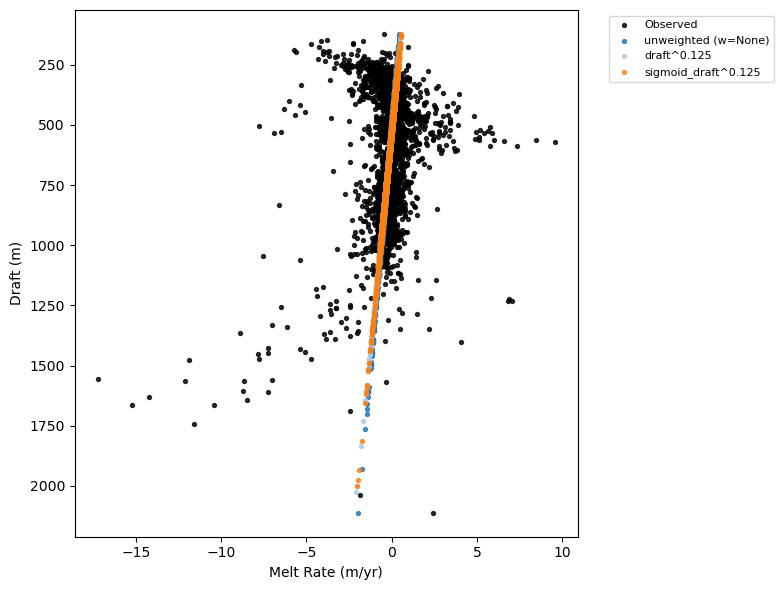

<Figure size 640x480 with 0 Axes>

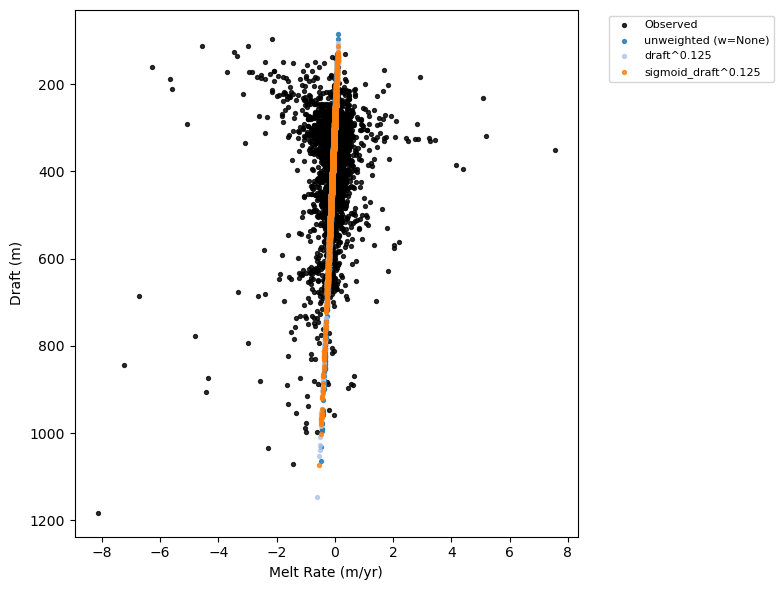

<Figure size 640x480 with 0 Axes>

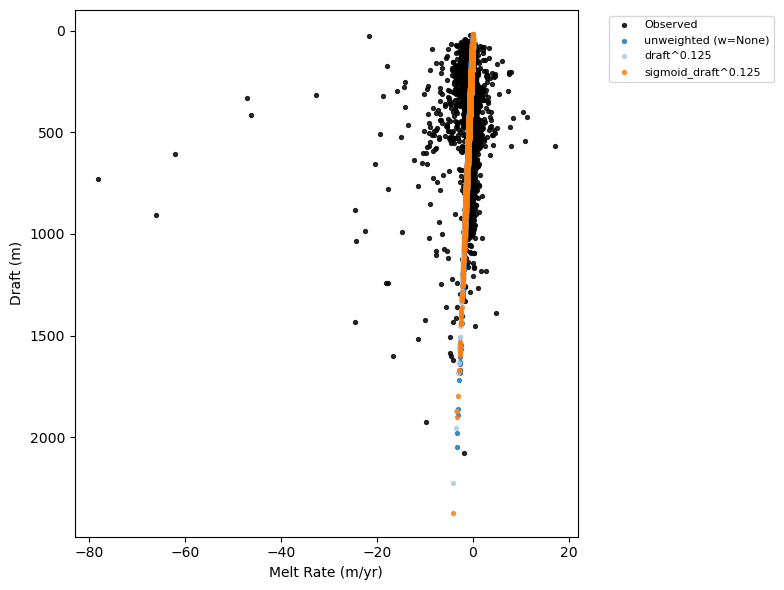

<Figure size 640x480 with 0 Axes>

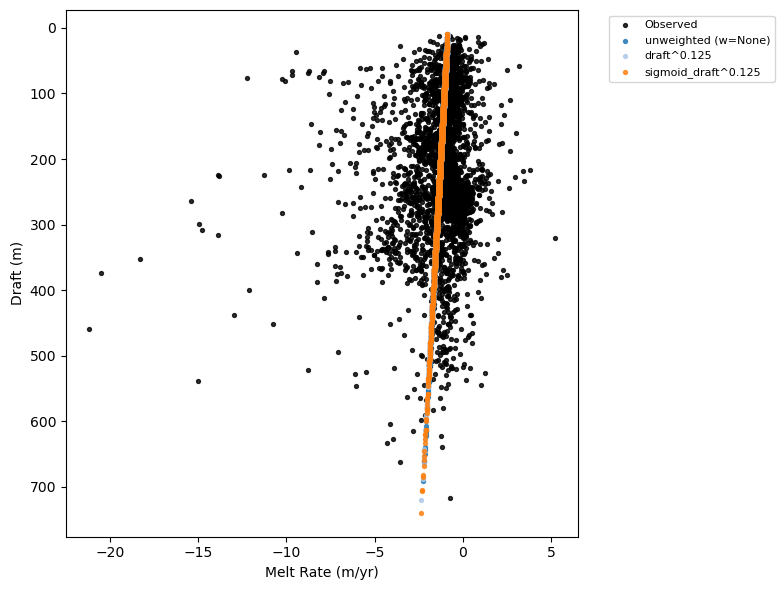

<Figure size 640x480 with 0 Axes>

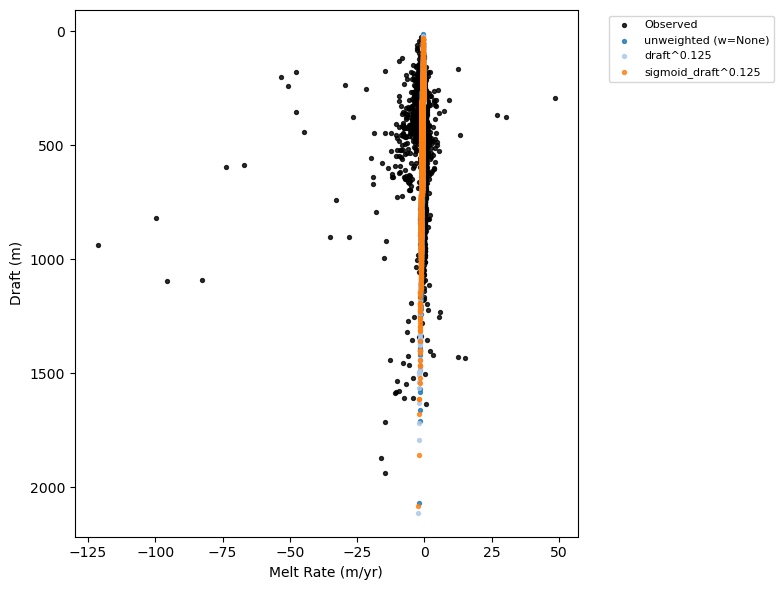

<Figure size 640x480 with 0 Axes>

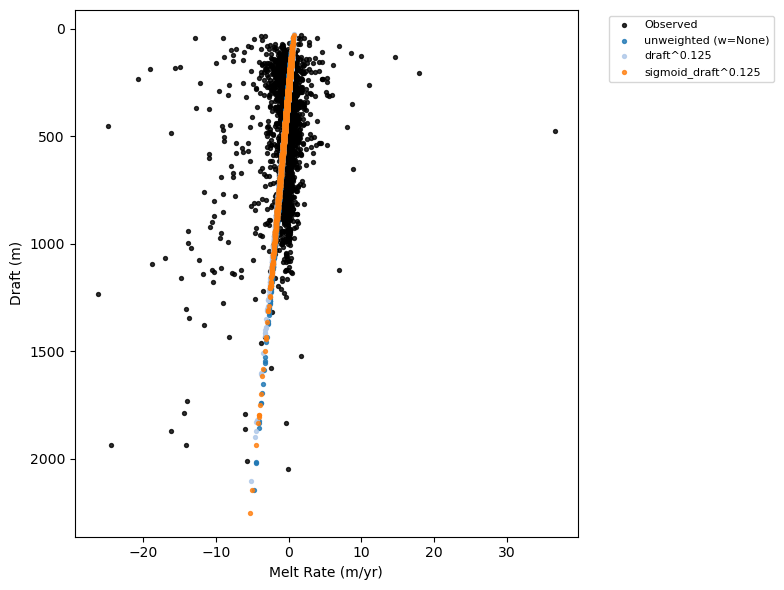

<Figure size 640x480 with 0 Axes>

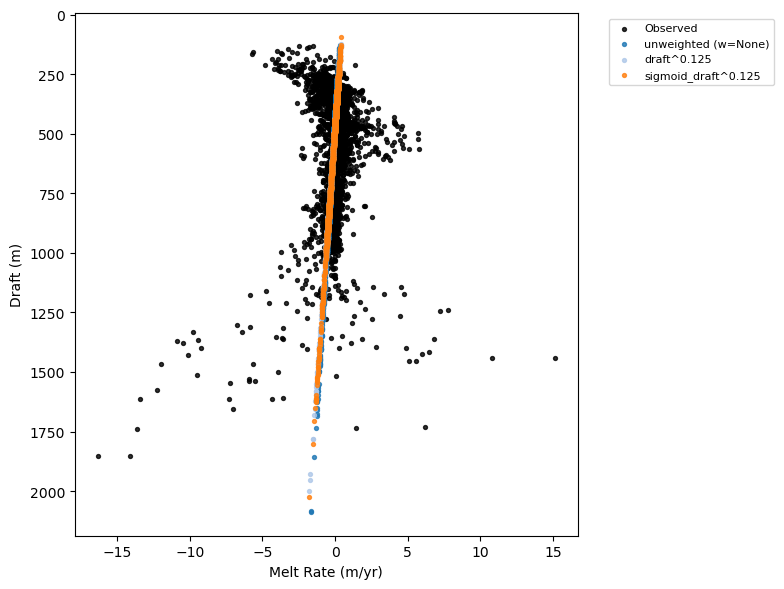

2025-07-11 02:04:44,231 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2025-07-11 02:04:44,231 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-07-11 02:04:44,232 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-07-11 02:04:44,234 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/smurugan9/opt/anaconda3/envs/aislens/lib/python3.10/multiprocessing/process.py", line 1

In [ ]:
def get_weighting_methods_with_unweighted(distances_2d):
    """Return a dict of all weighting methods as callables, including unweighted (w=None)."""
    return {
        "unweighted (w=None)": None,
        #"uniform": lambda mlt, h: uniform_weight(mlt, h),
        #"abs_melt": lambda mlt, h: abs_melt_weight(mlt, h),
        #"draft": lambda mlt, h: draft_weight(mlt, h, a=1),
        #"draft^0.5": lambda mlt, h: draft_weight(mlt, h, a=0.5),
        #"draft^0.25": lambda mlt, h: draft_weight(mlt, h, a=0.25),
        "draft^0.125": lambda mlt, h: draft_weight(mlt, h, a=0.125),
        #"draft^2": lambda mlt, h: draft_weight(mlt, h, a=2),
        #"draft^1.5": lambda mlt, h: draft_weight(mlt, h, a=1.5),
        #"gaussian_draft_dynamic": lambda mlt, h: gaussian_draft_weight(h),
        #"sigmoid_draft": lambda mlt, h: sigmoid_weight(h),
        #"sigmoid_draft^0.5": lambda mlt, h: sigmoid_weight(h, a=0.5),
        #"sigmoid_draft^0.25": lambda mlt, h: sigmoid_weight(h, a=0.25),
        "sigmoid_draft^0.125": lambda mlt, h: sigmoid_weight(h, a=0.125),
        #"sigmoid_draft^2": lambda mlt, h: sigmoid_weight(h, a=2),
        #"inv_GLdistance": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d),
        #"inv_GLdistance^0.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=0.5),
        #"#inv_GLdistance^2": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=2),
        #"inv_GLdistance^1.5": lambda mlt, h: inv_GLdistance_weight(mlt, distances_2d, a=1.5),
        #"sigmoid_x_inv_GLdistance": lambda mlt, h: sigmoid_x_inv_GLdistance_weight(mlt, h, distances_2d),
        #"draft_x_inv_GLdistance": lambda mlt, h: draft_x_inv_GLdistance_weight(mlt, h, distances_2d),
        #"melt_x_inv_GLdistance": lambda mlt, h: melt_x_inv_GLdistance_weight(mlt, distances_2d),
        #"melt_x_draft": lambda mlt, h: melt_x_draft_weight(mlt, h),
        #"melt_/_draft": lambda mlt, h: melt_x_draft_weight(mlt, h, a=1, b=-1),
    }

def predict_melt_vs_draft_modular(X, y, w):
    """Fit weighted or unweighted linear regression and return predicted y."""
    from sklearn.linear_model import LinearRegression
    reg = LinearRegression()
    reg.fit(X, y, sample_weight=w)
    return reg.predict(X).flatten()

def plot_melt_vs_draft_for_shelf_modular(
    melt_vals, draft_vals, mask, methods, mlt, drf, max_points=3000, alpha=0.7
):
    """Plot observed and predicted melt vs draft for a single shelf, including unweighted."""
    import matplotlib.pyplot as plt
    colors = plt.cm.tab20.colors
    idx = np.random.choice(np.where(mask)[0], min(max_points, np.sum(mask)), replace=False)
    plt.figure(figsize=(8, 6))
    plt.scatter(melt_vals[idx], draft_vals[idx], color='k', s=8, alpha=alpha, label='Observed')
    for mi, (method, weight_func) in enumerate(methods.items()):
        X = draft_vals[mask].reshape(-1, 1)
        y = melt_vals[mask].reshape(-1, 1)
        if weight_func is None:
            # Unweighted regression
            valid = np.ones_like(X, dtype=bool).flatten()
            w_valid = None
        else:
            try:
                w = weight_func(mlt, drf).flatten()[mask]
            except Exception as e:
                print(f"Skipping {method}: {e}")
                continue
            if np.all((w == 0) | np.isnan(w)):
                continue
            valid = (~np.isnan(w)) & (w > 0)
            if np.sum(valid) < 2:
                continue
            w_valid = w[valid]
        X_valid = X[valid]
        y_valid = y[valid]
        y_pred = predict_melt_vs_draft_modular(X_valid, y_valid, w_valid)
        idx_pred = np.random.choice(np.arange(len(y_pred)), min(max_points, len(y_pred)), replace=False)
        plt.scatter(y_pred[idx_pred], draft_vals[mask][valid][idx_pred],
                    color=colors[mi % len(colors)], s=8, alpha=alpha, label=method)
    plt.xlabel('Melt Rate (m/yr)')
    plt.ylabel('Draft (m)')
    plt.gca().invert_yaxis()
    plt.legend(fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    #plt.savefig(f"/Users/smurugan9/research/aislens/AISLENS/data/interim/draft_dependence/draft-weights/melt_distribution_{mlt.name}.png")

def plot_melt_vs_draft_all_methods_modular_with_unweighted(
    obs23_melt_tm, obs23_draft_tm, icems, insar_gl_shape, clip_data, shelf_names=None, max_points=3000, alpha=0.7
):
    """Loop over shelves and plot melt vs draft for all methods, including unweighted."""
    if shelf_names is None:
        shelf_names = list(icems.name.values)
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        drf = clip_data(obs23_draft_tm, i)
        distances_2d = get_distance_to_gl(mlt, icems, insar_gl_shape)
        melt_vals = mlt.values.flatten()
        draft_vals = drf.values.flatten()
        mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
        if np.sum(mask) < 10:
            continue
        methods = get_weighting_methods_with_unweighted(distances_2d)
        plot_melt_vs_draft_for_shelf_modular(melt_vals, draft_vals, mask, methods, mlt, drf, max_points, alpha)

# Example usage:

plot_melt_vs_draft_all_methods_modular_with_unweighted(
    obs23_melt_tm, obs23_draft_tm, icems, insar_gl_shape, clip_data, shelf_names=None, max_points=3000, alpha=0.8
)

NameError: name 'summary_df' is not defined

# Distribution of melt across ice shelves


Filchner-Ronne: std=1.385, IQR=0.675, outliers=13161
Ross: std=0.679, IQR=0.388, outliers=11787
Antarctica: std=4.014, IQR=0.867, outliers=52052
Peninsula: std=1.892, IQR=1.406, outliers=2662
West Antarctica: std=5.253, IQR=0.771, outliers=24421
East Antarctica: std=2.927, IQR=0.783, outliers=26150
IMBIE1: std=1.353, IQR=0.708, outliers=8100
IMBIE2: std=1.287, IQR=0.521, outliers=3542
IMBIE3: std=1.761, IQR=0.837, outliers=1511
IMBIE4: std=2.091, IQR=0.817, outliers=4055
IMBIE5: std=1.460, IQR=0.845, outliers=1119
IMBIE6: std=0.637, IQR=0.635, outliers=913
IMBIE7: std=9.584, IQR=1.778, outliers=282
IMBIE8: std=3.839, IQR=3.235, outliers=45
IMBIE9: std=1.595, IQR=1.358, outliers=255
IMBIE10: std=6.710, IQR=1.639, outliers=740
IMBIE11: std=1.408, IQR=0.846, outliers=455
IMBIE12: std=3.190, IQR=1.288, outliers=1854
IMBIE13: std=10.240, IQR=8.429, outliers=373
IMBIE14: std=8.706, IQR=3.458, outliers=629
IMBIE15: std=2.195, IQR=1.151, outliers=253
IMBIE16: std=3.462, IQR=1.716, outliers=215

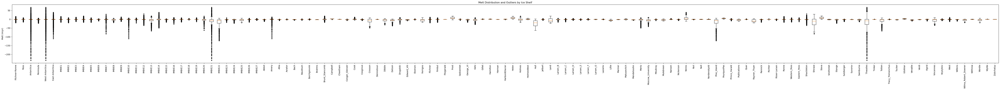

,shelf,std,iqr,n_outliers
0,Filchner-Ronne,1.385448,0.675252,13161
1,Ross,0.679283,0.387737,11787
2,Antarctica,4.014432,0.866694,52052
3,Peninsula,1.891715,1.405589,2662
4,West Antarctica,5.252915,0.770698,24421
...,...,...,...,...
126,Wilma_Robert_Downer,4.485639,5.840164,3
127,Withrow,0.569802,0.847980,0
128,Wordie,5.722237,7.059413,1
129,Wylde,0.500995,0.663489,1


In [ ]:
def melt_dispersion_and_outliers(obs23_melt_tm, icems, clip_data, quantiles=[0.01, 0.99]):
    shelf_names = list(icems.name.values)
    stats = []
    melt_data = []
    labels = []
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        vals = mlt.values.flatten()
        vals = vals[~np.isnan(vals)]
        if len(vals) == 0:
            continue
        std = np.std(vals)
        iqr = np.percentile(vals, 75) - np.percentile(vals, 25)
        q1, q3 = np.percentile(vals, [25, 75])
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        outliers = vals[(vals < lower) | (vals > upper)]
        stats.append({'shelf': shelf, 'std': std, 'iqr': iqr, 'n_outliers': len(outliers)})
        melt_data.append(vals)
        labels.append(shelf)  # Only add label if data exists
        print(f"{shelf}: std={std:.3f}, IQR={iqr:.3f}, outliers={len(outliers)}")
    # Boxplot
    plt.figure(figsize=(max(12, len(melt_data)//2), 6))
    plt.boxplot(melt_data, labels=labels, showfliers=True, flierprops={'marker':'o','color':'red','markersize':3})
    plt.xticks(rotation=90)
    plt.ylabel('Melt (m/yr)')
    plt.title('Melt Distribution and Outliers by Ice Shelf')
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(stats)

# Example usage:
melt_stats_df = melt_dispersion_and_outliers(obs23_melt_tm, icems, clip_data)
display(melt_stats_df)

# Distribution of draft across ice shelves

Filchner-Ronne: std=263.680, IQR=421.222, outliers=737
Ross: std=125.596, IQR=121.502, outliers=8412
Antarctica: std=241.738, IQR=235.466, outliers=26360
Peninsula: std=108.755, IQR=139.291, outliers=698
West Antarctica: std=222.560, IQR=209.600, outliers=13565
East Antarctica: std=256.130, IQR=272.759, outliers=8931
IMBIE1: std=265.672, IQR=418.019, outliers=733
IMBIE2: std=250.047, IQR=372.622, outliers=187
IMBIE3: std=152.659, IQR=212.296, outliers=111
IMBIE4: std=125.701, IQR=125.409, outliers=898
IMBIE5: std=143.958, IQR=168.509, outliers=359
IMBIE6: std=98.249, IQR=132.422, outliers=361
IMBIE7: std=178.026, IQR=138.452, outliers=135
IMBIE8: std=167.374, IQR=239.130, outliers=2
IMBIE9: std=213.126, IQR=320.470, outliers=7
IMBIE10: std=423.506, IQR=405.653, outliers=585
IMBIE11: std=239.351, IQR=361.514, outliers=53
IMBIE12: std=146.133, IQR=174.628, outliers=326
IMBIE13: std=426.080, IQR=547.430, outliers=115
IMBIE14: std=209.696, IQR=247.057, outliers=121
IMBIE15: std=222.505, IQ

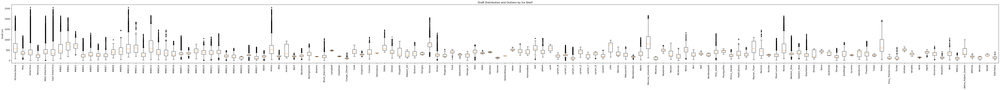

,shelf,std,iqr,n_outliers
0,Filchner-Ronne,263.679993,421.221588,737
1,Ross,125.595688,121.501556,8412
2,Antarctica,241.738312,235.465828,26360
3,Peninsula,108.754959,139.290970,698
4,West Antarctica,222.560242,209.600487,13565
...,...,...,...,...
126,Wilma_Robert_Downer,179.400040,299.686646,0
127,Withrow,44.319012,58.748428,1
128,Wordie,59.382393,108.421490,0
129,Wylde,46.915806,73.252365,0


In [ ]:
def draft_dispersion_and_outliers(obs23_draft_tm, icems, clip_data):
    shelf_names = list(icems.name.values)
    stats = []
    draft_data = []
    labels = []
    for i, shelf in enumerate(shelf_names):
        drf = clip_data(obs23_draft_tm, i)
        vals = drf.values.flatten()
        vals = vals[~np.isnan(vals)]
        if len(vals) == 0:
            continue
        std = np.std(vals)
        iqr = np.percentile(vals, 75) - np.percentile(vals, 25)
        q1, q3 = np.percentile(vals, [25, 75])
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        outliers = vals[(vals < lower) | (vals > upper)]
        stats.append({'shelf': shelf, 'std': std, 'iqr': iqr, 'n_outliers': len(outliers)})
        draft_data.append(vals)
        labels.append(shelf)
        print(f"{shelf}: std={std:.3f}, IQR={iqr:.3f}, outliers={len(outliers)}")
    # Boxplot
    plt.figure(figsize=(max(12, len(draft_data)//2), 6))
    plt.boxplot(draft_data, labels=labels, showfliers=True, flierprops={'marker':'o','color':'red','markersize':3})
    plt.xticks(rotation=90)
    plt.ylabel('Draft (m)')
    plt.title('Draft Distribution and Outliers by Ice Shelf')
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(stats)

# Example usage:
draft_stats_df = draft_dispersion_and_outliers(obs23_draft_tm, icems, clip_data)
display(draft_stats_df)

## Distribution of melt and draft across ice shelves

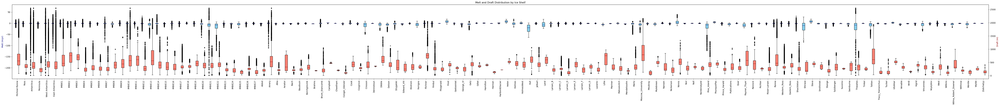

In [ ]:
def compare_melt_and_draft_boxplots(obs23_melt_tm, obs23_draft_tm, icems, clip_data):
    shelf_names = list(icems.name.values)
    melt_data = []
    draft_data = []
    labels = []
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i).values.flatten()
        drf = clip_data(obs23_draft_tm, i).values.flatten()
        mlt = mlt[~np.isnan(mlt)]
        drf = drf[~np.isnan(drf)]
        if len(mlt) == 0 or len(drf) == 0:
            continue
        melt_data.append(mlt)
        draft_data.append(drf)
        labels.append(shelf)
    # Plot
    fig, ax1 = plt.subplots(figsize=(max(12, len(labels)//2), 7))
    positions_melt = np.arange(len(labels)) - 0.2
    positions_draft = np.arange(len(labels)) + 0.2
    bp1 = ax1.boxplot(melt_data, positions=positions_melt, widths=0.35, patch_artist=True,
                      boxprops=dict(facecolor='skyblue'), showfliers=True,
                      flierprops={'marker':'o','color':'blue','markersize':3}, medianprops=dict(color='navy'))
    ax2 = ax1.twinx()
    bp2 = ax2.boxplot(draft_data, positions=positions_draft, widths=0.35, patch_artist=True,
                      boxprops=dict(facecolor='salmon'), showfliers=True,
                      flierprops={'marker':'o','color':'red','markersize':3}, medianprops=dict(color='darkred'))
    ax1.set_xticks(np.arange(len(labels)))
    ax1.set_xticklabels(labels, rotation=90)
    ax1.set_ylabel('Melt (m/yr)', color='navy')
    ax2.set_ylabel('Draft (m)', color='darkred')
    plt.title('Melt and Draft Distribution by Ice Shelf')
    plt.tight_layout()
    plt.show()

# Example usage:
compare_melt_and_draft_boxplots(obs23_melt_tm, obs23_draft_tm, icems, clip_data)

## Distribution of melt and draft - normalized

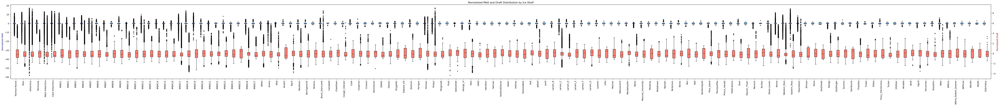

In [69]:
def compare_melt_and_draft_boxplots_normalized(obs23_melt_tm, obs23_draft_tm, icems, clip_data):
    shelf_names = list(icems.name.values)
    melt_data = []
    draft_data = []
    labels = []
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i).values.flatten()
        drf = clip_data(obs23_draft_tm, i).values.flatten()
        mlt = mlt[~np.isnan(mlt)]
        drf = drf[~np.isnan(drf)]
        if len(mlt) == 0 or len(drf) == 0:
            continue
        # Normalize: (x - mean) / std
        mlt_norm = (mlt - np.mean(mlt)) / np.std(mlt) if np.std(mlt) > 0 else mlt * 0
        drf_norm = (drf - np.mean(drf)) / np.std(drf) if np.std(drf) > 0 else drf * 0
        melt_data.append(mlt_norm)
        draft_data.append(drf_norm)
        labels.append(shelf)
    # Plot
    fig, ax1 = plt.subplots(figsize=(max(12, len(labels)//2), 7))
    positions_melt = np.arange(len(labels)) - 0.2
    positions_draft = np.arange(len(labels)) + 0.2
    bp1 = ax1.boxplot(melt_data, positions=positions_melt, widths=0.35, patch_artist=True,
                      boxprops=dict(facecolor='skyblue'), showfliers=True,
                      flierprops={'marker':'o','color':'blue','markersize':3}, medianprops=dict(color='navy'))
    ax2 = ax1.twinx()
    bp2 = ax2.boxplot(draft_data, positions=positions_draft, widths=0.35, patch_artist=True,
                      boxprops=dict(facecolor='salmon'), showfliers=True,
                      flierprops={'marker':'o','color':'red','markersize':3}, medianprops=dict(color='darkred'))
    ax1.set_xticks(np.arange(len(labels)))
    ax1.set_xticklabels(labels, rotation=90)
    ax1.set_ylabel('Normalized Melt', color='navy')
    ax2.set_ylabel('Normalized Draft', color='darkred')
    plt.title('Normalized Melt and Draft Distribution by Ice Shelf')
    plt.tight_layout()
    plt.show()

# Example usage:
compare_melt_and_draft_boxplots_normalized(obs23_melt_tm, obs23_draft_tm, icems, clip_data)

## Distribution of melt by draft bins for ice shelves

### Violin plots

In [ ]:
def plot_melt_distribution_by_draft_bin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                        shelf_names=None, n_bins=6, violin=True):
    """
    For each shelf, plot the distribution of melt rates in bins of draft (depth).
    """
    if shelf_names is None:
        shelf_names = list(icems.name.values)
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        drf = clip_data(obs23_draft_tm, i)
        melt_vals = mlt.values.flatten()
        draft_vals = drf.values.flatten()
        mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
        if np.sum(mask) < 10:
            continue
        melt_vals = melt_vals[mask]
        draft_vals = draft_vals[mask]
        # Bin draft
        bins = np.linspace(np.nanmin(draft_vals), np.nanmax(draft_vals), n_bins+1)
        bin_labels = [f"{int(bins[j])}-{int(bins[j+1])}m" for j in range(n_bins)]
        draft_bin = pd.cut(draft_vals, bins=bins, labels=bin_labels, include_lowest=True)
        df = pd.DataFrame({'Melt': melt_vals, 'DraftBin': draft_bin})
        plt.figure(figsize=(8,5))
        if violin:
            sns.violinplot(x='DraftBin', y='Melt', data=df, inner='box', cut=0)
        else:
            sns.boxplot(x='DraftBin', y='Melt', data=df)
        plt.title(f'Melt Rate Distribution by Draft Bin: {shelf}')
        plt.xlabel('Draft Bin (m)')
        plt.ylabel('Melt Rate (m/yr)')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Example usage: violin plots for all shelves
plot_melt_distribution_by_draft_bin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, n_bins=6, violin=True)

### 2D hexbin

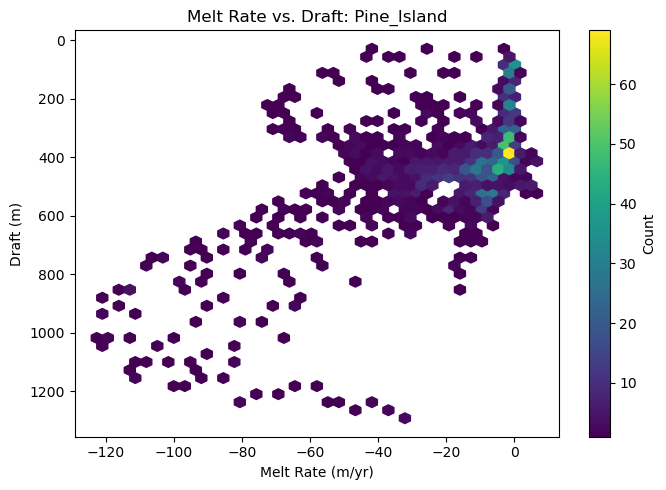

In [33]:
def plot_melt_vs_draft_hexbin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name):
    i = list(icems.name.values).index(shelf_name)
    mlt = clip_data(obs23_melt_tm, i)
    drf = clip_data(obs23_draft_tm, i)
    melt_vals = mlt.values.flatten()
    draft_vals = drf.values.flatten()
    mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
    plt.figure(figsize=(7,5))
    plt.hexbin(melt_vals[mask], draft_vals[mask], gridsize=40, cmap='viridis', mincnt=1)
    plt.ylabel('Draft (m)')
    # Reverse the y axis
    plt.gca().invert_yaxis()
    plt.xlabel('Melt Rate (m/yr)')
    plt.title(f'Melt Rate vs. Draft: {shelf_name}')
    plt.colorbar(label='Count')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_melt_vs_draft_hexbin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name='Pine_Island')

### Facet grid

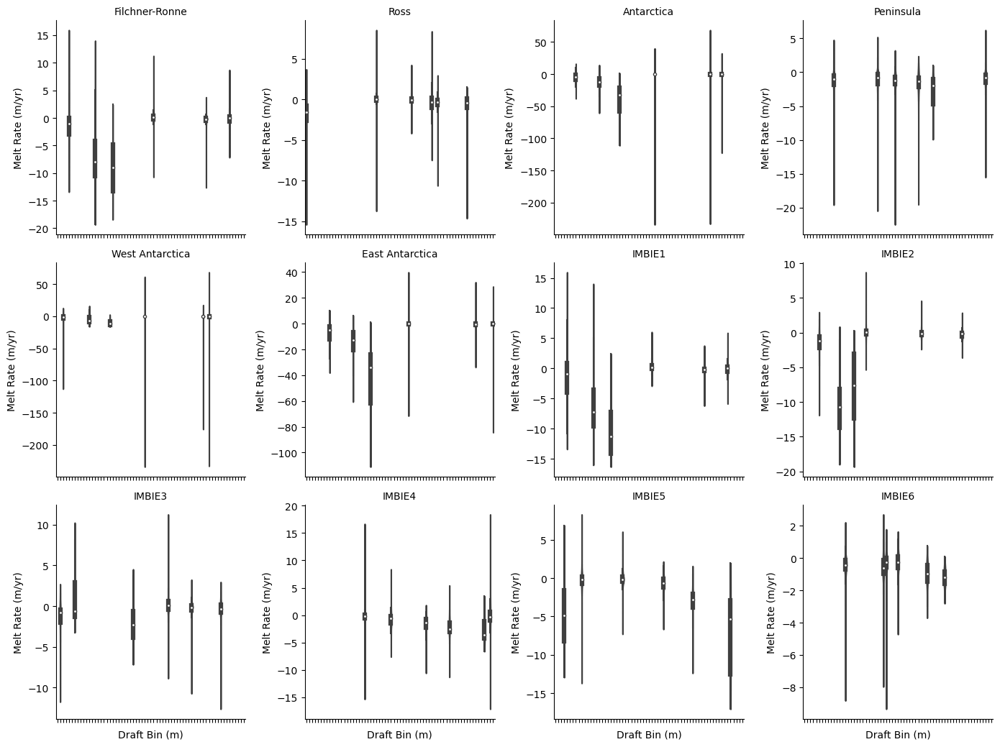

In [ ]:
def facet_melt_by_draft_bin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_names=None, n_bins=6, violin=True, max_facets=12):
    # Gather all data into a single DataFrame
    if shelf_names is None:
        shelf_names = list(icems.name.values)[:max_facets]  # Limit to avoid too many plots
    records = []
    for i, shelf in enumerate(shelf_names):
        mlt = clip_data(obs23_melt_tm, i)
        drf = clip_data(obs23_draft_tm, i)
        melt_vals = mlt.values.flatten()
        draft_vals = drf.values.flatten()
        mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
        if np.sum(mask) < 10:
            continue
        melt_vals = melt_vals[mask]
        draft_vals = draft_vals[mask]
        bins = np.linspace(np.nanmin(draft_vals), np.nanmax(draft_vals), n_bins+1)
        bin_labels = [f"{int(bins[j])}-{int(bins[j+1])}m" for j in range(n_bins)]
        draft_bin = pd.cut(draft_vals, bins=bins, labels=bin_labels, include_lowest=True)
        for melt, dbin in zip(melt_vals, draft_bin):
            records.append({'Melt': melt, 'DraftBin': dbin, 'Shelf': shelf})
    df = pd.DataFrame(records)
    # Plot with FacetGrid
    g = sns.FacetGrid(df, col="Shelf", col_wrap=4, sharey=False, height=3.5)
    if violin:
        g.map_dataframe(sns.violinplot, x="DraftBin", y="Melt", inner="box", cut=0, order=sorted(df['DraftBin'].dropna().unique()))
    else:
        g.map_dataframe(sns.boxplot, x="DraftBin", y="Melt", order=sorted(df['DraftBin'].dropna().unique()))
    g.set_titles("{col_name}")
    for ax in g.axes.flatten():
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
        ax.set_xlabel("Draft Bin (m)")
        ax.set_ylabel("Melt Rate (m/yr)")
    plt.tight_layout()
    plt.show()

# Example usage:
facet_melt_by_draft_bin(obs23_melt_tm, obs23_draft_tm, icems, clip_data, n_bins=6, violin=True, max_facets=12)

## 3D plot of melt vs draft for an ice shelf

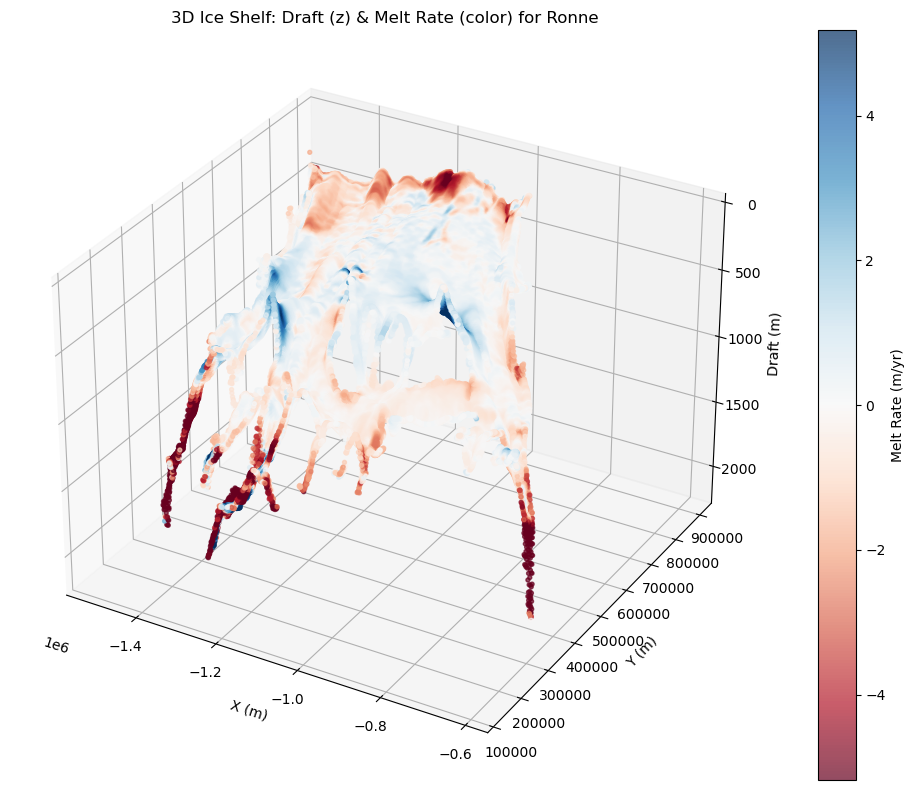

In [ ]:
def plot_3d_iceshelf_draft(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name):
    i = list(icems.name.values).index(shelf_name)
    mlt = clip_data(obs23_melt_tm, i)
    drf = clip_data(obs23_draft_tm, i)
    x = mlt['x'].values
    y = mlt['y'].values
    X, Y = np.meshgrid(x, y, indexing='xy')
    melt_vals = mlt.values
    draft_vals = drf.values

    mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
    X_flat = X[mask]
    Y_flat = Y[mask]
    Z_flat = draft_vals[mask]
    melt_flat = melt_vals[mask]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    #vmax = np.nanmax(np.abs(melt_vals[mask]))
    vmin = np.nanquantile(melt_vals[mask], 0.01)
    vmax = np.nanquantile(melt_vals[mask], 0.99)
    vmax = max(np.abs(vmin), np.abs(vmax))  # Ensure vmax is positive
    sc = ax.scatter(X_flat, Y_flat, Z_flat, c=melt_flat, cmap='RdBu',vmin=-vmax, vmax=vmax,  s=8, alpha=0.7)
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.set_zlabel('Draft (m)')
    # Reverse the z-axis for draft
    ax.invert_zaxis()
    ax.set_title(f'3D Ice Shelf: Draft (z) & Melt Rate (color) for {shelf_name}')
    fig.colorbar(sc, ax=ax, label='Melt Rate (m/yr)')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_3d_iceshelf_draft(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name='Ronne')

### 3D Interactive map of melt vs draft for an ice shelf

In [ ]:
def plot_3d_melt_draft_interactive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name):
    i = list(icems.name.values).index(shelf_name)
    mlt = clip_data(obs23_melt_tm, i)
    drf = clip_data(obs23_draft_tm, i)
    x, y = np.meshgrid(mlt['x'].values, mlt['y'].values, indexing='xy')
    melt_vals = mlt.values.flatten()
    draft_vals = drf.values.flatten()
    x_flat = x.flatten()
    y_flat = y.flatten()
    mask = ~np.isnan(melt_vals) & ~np.isnan(draft_vals)
    vmin = np.nanquantile(melt_vals[mask], 0.01)
    vmax = np.nanquantile(melt_vals[mask], 0.99)
    vmax = max(np.abs(vmin), np.abs(vmax))  # Ensure vmax is positive
    fig = go.Figure(data=[go.Scatter3d(
        x=x_flat[mask],
        y=y_flat[mask],
        z=draft_vals[mask],
        mode='markers',
        marker=dict(
            size=3,
            color=melt_vals[mask],
            colorscale='RdBu',
            cmin=-vmax,
            cmax=+vmax,
            colorbar=dict(title='Melt Rate (m/yr)'),
            opacity=0.7
        )
    )])
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Draft (m)',
            zaxis_autorange='reversed'
        ),
        title=f'3D Scatter: Melt Rate (color) vs Draft for {shelf_name}'
    )
    fig.show()

plot_3d_melt_draft_interactive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, shelf_name='Filchner-Ronne')